```python
file1 \_ |-----------------------------------|   -+-
file2 \_ |-----------------------------------|    |   training data
file3 \_ |-----------------------------------|    |        80%
file4 \_ |-----------------------------------|    |
                                                 -+-
file5 \_ |-----------------------------------|    |  validation data
file6 \_ |-----------------------------------|    |        20%
         |-----------------------------------|   -+-
```

In [1]:
import os
import glob

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

from utils.MovingAverager import *

# 讀檔

In [2]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def smooth(df):
    df['acc_x'] = moving_average(df['acc_x'], 11)
    df['acc_y'] = moving_average(df['acc_y'], 11)
    df['acc_z'] = moving_average(df['acc_z'], 11)

    df['lin_acc_x'] = moving_average(df['lin_acc_x'], 11)
    df['lin_acc_y'] = moving_average(df['lin_acc_y'], 11)
    df['lin_acc_z'] = moving_average(df['lin_acc_z'], 11)
    
    df['mag_x'] = moving_average(df['mag_x'], 11)
    df['mag_y'] = moving_average(df['mag_y'], 11)
    df['mag_z'] = moving_average(df['mag_z'], 11)

    return df

def gen_total_mag(df: pd.DataFrame):
    df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))
    
    return df


def calculate_angle(df):
    df['acc_t'] = np.sqrt((df['acc_x'] ** 2) + (df['acc_y'] ** 2) + (df['acc_z'] ** 2))
    df[['gacc_x', 'gacc_y', 'gacc_z']] = df[['acc_x', 'acc_y', 'acc_z']].to_numpy() - df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z']].to_numpy()
    df['gacc_t'] = np.sqrt((df['gacc_x'] ** 2) + (df['gacc_y'] ** 2) + (df['gacc_z'] ** 2))

    acc_xyz = df[['acc_x', 'acc_y', 'acc_z']].to_numpy()
    acc_t = df['acc_t'].to_numpy()
    gacc_t = df['gacc_t'].to_numpy()
    gacc_xyz = np.concatenate((np.zeros((len(df), 2)), gacc_t[:, None]), axis=-1)

    df['angle'] = np.arccos((np.sum(acc_xyz * gacc_xyz, axis=-1)) / (acc_t *  gacc_t)) / np.pi * 180
    
    return df


# def get_rotation_matrix(angle):
#     pitch = 0
#     roll = angle / 180 * np.pi
#     yaw = 0
#     p_m = [[np.cos(pitch), 0, np.sin(pitch)], [0, 1, 0], [-np.sin(pitch), 0, np.cos(pitch)]]
#     y_m = [[1, 0, 0], [0, np.cos(roll), -np.sin(roll)], [0, np.sin(roll), np.cos(roll)]]
#     r_m = [[np.cos(yaw), -np.sin(yaw), 0], [np.sin(yaw), np.cos(yaw), 0], [0, 0, 1]]
    
#     p_m, y_m, r_m = np.array(p_m), np.array(y_m), np.array(r_m)
#     rotation_matrix = p_m @ y_m @ r_m
    
#     return rotation_matrix


# def calculate_transform(row, column_name):
#     R = get_rotation_matrix(row['angle'] - 45)
#     new_row = R @ row[column_name]
    
#     return new_row


def calculate_rotation_matrix_from_vectors(vec1, vec2):
    """ Find the rotation matrix that aligns vec1 to vec2
    :param vec1: A 3d "source" vector
    :param vec2: A 3d "destination" vector
    :return mat: A transform matrix (3x3) which when applied to vec1, aligns it with vec2.
    """
    a, b = (vec1 / np.linalg.norm(vec1)).reshape(3), (vec2 / np.linalg.norm(vec2)).reshape(3)
    v = np.cross(a, b)
    c = np.dot(a, b)
    s = np.linalg.norm(v)
    kmat = np.array([[0, -v[2], v[1]], [v[2], 0, -v[0]], [-v[1], v[0], 0]])
    rotation_matrix = np.eye(3) + kmat + kmat.dot(kmat) * ((1 - c) / (s ** 2))
    return rotation_matrix


def rotate_vectors(row):
    acc_t = np.sqrt((row['acc_x'] ** 2) + (row['acc_y'] ** 2) + (row['acc_z'] ** 2))
    gacc_x, gacc_y, gacc_z = row[['acc_x', 'acc_y', 'acc_z']].to_numpy() - row[['lin_acc_x', 'lin_acc_y', 'lin_acc_z']].to_numpy()
    gacc_t = np.sqrt((gacc_x ** 2) + (gacc_y ** 2) + (gacc_z ** 2))

    old_gacc_xyz = np.array([gacc_x, gacc_y, gacc_z])
    n_gacc = np.sqrt(2) / 2 * gacc_t
    new_gacc_xyz = np.array([0, n_gacc, n_gacc])

    transformation_matrix = calculate_rotation_matrix_from_vectors(old_gacc_xyz, new_gacc_xyz)

    return np.concatenate((transformation_matrix @ row[['acc_x', 'acc_y', 'acc_z']], transformation_matrix @ row[['lin_acc_x', 'lin_acc_y', 'lin_acc_z']], transformation_matrix @ row[['mag_x', 'mag_y', 'mag_z']]))


def gen_45_mag(df):
#     df[['mag_x', 'mag_y', 'mag_z']] = df.apply(lambda x: calculate_transform(x, ['mag_x', 'mag_y', 'mag_z']), axis=1, result_type='expand')
#     df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))

    df[['acc_x', 'acc_y', 'acc_z', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_x', 'mag_y', 'mag_z']] = df.apply(lambda x: rotate_vectors(x), axis=1, result_type='expand')
    df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))
    
    return df


def select_data(df):
    return df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'angle', 'mag_x', 'mag_y', 'mag_z', 'mag_t', 'system_time']]


def load_original_data(path, rotate=False):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = total_df[:-5]  # remove last None value row
    total_df = rename_data(total_df)
    
    total_df = smooth(total_df)
    total_df = gen_total_mag(total_df)
    
    if rotate:
        total_df = gen_45_mag(total_df)
    total_df = calculate_angle(total_df)
    total_df = select_data(total_df)
    
    return total_df

In [3]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, seq_len=25):
    num_of_segs = int(np.floor(len(df) / seq_len))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * seq_len):int((i + 1) * seq_len)].to_numpy()
        segments.append(seg)
        
    return segments


def split_segments_overlap(df, seq_len=25, shift=15):
    
    segments = []
    for i in range(0, len(df) - seq_len, shift):
        seg = df.iloc[i:i + seq_len].to_numpy()
        segments.append(seg)
        
    return segments


def preprocess_data(df, seq_len=25, shift=15, is_train_data=False):
    if is_train_data:
        segs = split_segments_overlap(df, seq_len, shift)
    else:
        segs = split_segments(df, seq_len)
    
    return segs

In [4]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

#         print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num, file_index=None, is_train_data=False):
    prefix = 'train' if is_train_data else 'valid'
    pair_data = []
    folder_paths = glob.glob(f'*{os.path.normpath(root_folder)}/*')

    if file_index is not None:
        folder_paths = folder_paths[file_index[0]:file_index[1]]

    for i, folder_path in enumerate(folder_paths):
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(f'{prefix} {i + 1: >3}: {folder_path}')
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path, rotate=False)
        target_df = load_original_data(target_path, rotate=True)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        source_df, target_df = align_data(source_df, target_df)

        source_segs = preprocess_data(source_df, seq_len, shift, is_train_data)
        target_segs = preprocess_data(target_df, seq_len, shift, is_train_data)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [5]:
datapoint_per_second = 20
duration = 2
seq_len = 25
shift = 15  # the shfit of the data
classes = {0: 'target', 1: 'front_pocket', 2: 'pocket', 3: 'swing'}

In [6]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [7]:
train_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[0, 8], is_train_data=True)
valid_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[8, 10], is_train_data=False)

train_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[0, 8], is_train_data=True)
valid_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[8, 10], is_train_data=False)

train_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[0, 8], is_train_data=True)
valid_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[8, 10], is_train_data=False)

train   1: front_pocket/202302071628
train   2: front_pocket/202302071652
train   3: front_pocket/202302071523
train   4: front_pocket/202302071531
train   5: front_pocket/202302071715
train   6: front_pocket/202302071641
train   7: front_pocket/202302071541
train   8: front_pocket/202302071619
valid   1: front_pocket/202302071704
valid   2: front_pocket/202302071724
train   1: pocket/202302132108
train   2: pocket/202302131750
train   3: pocket/202302131601
train   4: pocket/202302071606
train   5: pocket/202302132053
train   6: pocket/202302122132
train   7: pocket/202302132116
train   8: pocket/202302131643
valid   1: pocket/202301101952
valid   2: pocket/202302132101
train   1: swing/202302142339
train   2: swing/202302132131
train   3: swing/202302142117
train   4: swing/202302132124
train   5: swing/202302121947
train   6: swing/202302121857
train   7: swing/202302142128
train   8: swing/202302121920
valid   1: swing/202302121909
valid   2: swing/202302142331


In [8]:
print(len(train_front_pocket_pair_data), len(train_pocket_pair_data), len(train_swing_pair_data))

3070 3003 2900


In [9]:
train_front_pocket_pair_data[0][0][0], train_front_pocket_pair_data[0][2][0]

(array([-3.50329294e-01,  1.51894025e-01,  2.26504005e-01, -2.18800381e-01,
        -2.56263137e-01, -2.19771296e-01,  8.89969956e+01,  1.90718285e+01,
        -1.88885755e+01,  3.45052268e+01,  4.37163997e+01,  1.67575811e+09]),
 array([-1.29357491e-01, -1.25323302e-01,  1.30018450e-01, -5.08982837e-02,
        -8.86559859e-02,  1.07779831e-01,  4.39571094e+01, -4.00427488e+01,
        -3.84654723e+00, -1.95729747e+01,  4.47361040e+01,  1.67575811e+09]))

# 建立dataloader

In [19]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [20]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [21]:
class FirstDerivativeLoss(nn.Module):
    def __init__(self, weight=None, size_average=None, reduce=None, reduction='mean'):
        super(FirstDerivativeLoss, self).__init__()

    def forward(self, source, target):
        # calculate the first derivative
        source_o = torch.reshape(source, (len(source), -1))
        target_o = torch.reshape(target, (len(target), -1))
        d_source = source_o[1:] - source_o[:-1]
        d_target = target_o[1:] - target_o[:-1]
        deriv = d_source - d_target

        # calculate the loss as the mean squared error of the derivative
        loss = torch.mean(torch.pow(deriv, 2))

        return loss

In [22]:
def generator_loss(z_imu, target_imu, predict_mag, target_mag, source_total_mag, target_total_mag):
    imu_loss = mse_loss(z_imu, target_imu)
    mag_loss = mse_loss(predict_mag, target_mag)
    d1_loss = div_loss(predict_mag, target_mag)
    
    pred_total_mag = torch.sqrt(torch.sum(torch.pow(predict_mag, 2), dim=-1))
    
#     print(source_total_mag.shape, target_total_mag.shape, pred_total_mag.shape)
#     print(source_total_mag[0])
#     print(target_total_mag[0])
#     print(pred_total_mag[0])
    
    smag_limitation_loss = torch.mean(torch.abs(pred_total_mag - source_total_mag))
    tmag_limitation_loss = torch.mean(torch.abs(pred_total_mag - target_total_mag))

    total_loss = imu_loss + mag_loss + d1_loss + smag_limitation_loss * 0.25 + tmag_limitation_loss * 0.75
    return total_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss)

# def discriminator_loss(d_real, d_fake):
#     real_loss = bce_loss(d_real, torch.ones_like(d_real))
#     fake_loss = bce_loss(d_fake, torch.zeros_like(d_fake))

#     return real_loss + fake_loss

In [23]:
train_data = train_front_pocket_pair_data + train_pocket_pair_data + train_swing_pair_data
valid_data = valid_front_pocket_pair_data + valid_pocket_pair_data + valid_swing_pair_data

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=512)

In [24]:
batch = next(iter(train_loader))

In [25]:
EPOCH = 6000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()
div_loss = FirstDerivativeLoss()

In [26]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [27]:
class Classifier(nn.Module):
    def __init__(self, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.nn = nn.Sequential(
            nn.Linear(6, 16),
            nn.SELU(),
            nn.Linear(16, 16),
            nn.SELU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16, hidden_size=32, num_layers=2, batch_first=True, bidirectional=True)
        
        self.last = nn.Sequential(
            nn.Linear(64 * self.seq_len, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
        )
        
    def forward(self, x):  # input: (bs, seq_len, 6)
        h = self.nn(x)

        hz, _ = self.rnn(h)
        
        hz = hz.reshape(len(x), -1)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.num_of_classes))
        
        return out, hz
    
    def predict_label(self, x):
        predict_probability, _ = self(x)
        predict_probability = predict_probability.reshape((-1, self.num_of_classes))
        _, predict_class = torch.max(predict_probability, 1)
        pred_one_hot = F.one_hot(predict_class, num_classes=self.num_of_classes).to(device).float()
        pred_one_hot = pred_one_hot.reshape(-1, self.num_of_classes)
        
        return predict_class, pred_one_hot

In [28]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.imu_layer = nn.Sequential(
            nn.Linear(6, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 64),
            nn.LeakyReLU(),
        )
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        self.pos_encoder = PositionalEncoding(64, 0.1)
        
        self.encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        self.nn = nn.Sequential(
            nn.Linear(64, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 6),
            nn.LeakyReLU(),
        )
        
        self.task_controller = nn.Sequential(
            nn.Linear(70, 64),
            nn.LeakyReLU(),
            nn.Linear(64, 32),
            nn.LeakyReLU(), 
            nn.Linear(32, 64 * 3),
            nn.LeakyReLU(),
        )
        
        self.decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        
        self.mag_last = nn.Sequential(
            nn.Linear(64, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 3),
        )
        
    def forward(self, source_imu, source_mag, source_class, st_angle):
        
        ### step 1
        h_imu = self.imu_layer(source_imu)
        h_imu = self.pos_encoder(h_imu)
        
        h_mag = self.mag_layer(source_mag)
#         h_mag = self.pos_encoder(h_mag)
        
        ### step 2
        z = self.encoder(h_imu)
        z_imu = self.nn(z)
        
        ### step 3
        z_gap = torch.mean(z, dim=1)  # (bs, 64)
        task_latent = torch.concat([z_gap, source_class], dim=-1)  # (bs, 64) + (bs, 4) -> (bs, 68)
        task_latent = task_latent[:, None, :].repeat(1, self.seq_len, 1)  # (bs, 68) -> (bs, seq_len, 68)
        task_latent = torch.concat([task_latent, st_angle], dim=-1)  # (bs, seq_len, 68) + (bs, seq_len, 1) -> (bs, seq_len, 69)
        
        task_latent = self.task_controller(task_latent)
#         task_matrix = task_latent.reshape((len(source_imu), self.seq_len, 3, 3))

#         z_gap = torch.mean(z, dim=1)
#         task_latent = torch.concat([z_gap, source_class], dim=-1)
#         task_latent = self.task_controller(task_latent)
#         task_matrix = task_latent.reshape((len(source_mag), 3, 3))
        
        ### step 4
#         pred_latent = self.decoder(h_mag, z)
#         pred_mag = self.mag_last(pred_latent)
#         pred_latent = self.mag_last(pred_latent)

        h_mag = h_mag.reshape(len(source_imu) * self.seq_len, 1, -1)  # (bs * seq_len, 1, 3)
        task_matrix = task_latent.reshape(len(source_imu) * self.seq_len, 64, 3)  # (bs * seq_len, 3, 3)
        
        pred_mag = torch.matmul(h_mag, task_matrix)  # (bs * seq_len, 1, 3) * (bs * seq_len, 3, 3) -> (bs * seq_len, 1, 3)
        pred_mag = pred_mag.reshape(len(source_imu), self.seq_len, -1)
        
        return z_imu, pred_mag
        

# Train Classifier

In [29]:
classifier = Classifier(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
optimizer_C = torch.optim.Adam(classifier.parameters(), lr=0.0005)
lr_scheduler_C = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_C, T_max=50, eta_min=0.0000001)

In [30]:
from torchinfo import summary
summary(classifier, input_size=[(1, 25, 6)])

Layer (type:depth-idx)                   Output Shape              Param #
Classifier                               [1, 4]                    --
├─Sequential: 1-1                        [1, 25, 16]               --
│    └─Linear: 2-1                       [1, 25, 16]               112
│    └─SELU: 2-2                         [1, 25, 16]               --
│    └─Linear: 2-3                       [1, 25, 16]               272
│    └─SELU: 2-4                         [1, 25, 16]               --
├─RNN: 1-2                               [1, 25, 64]               9,472
├─Sequential: 1-3                        [1, 4]                    --
│    └─Linear: 2-5                       [1, 16]                   25,616
│    └─Tanh: 2-6                         [1, 16]                   --
│    └─Linear: 2-7                       [1, 4]                    68
Total params: 35,540
Trainable params: 35,540
Non-trainable params: 0
Total mult-adds (M): 0.26
Input size (MB): 0.00
Forward/backward pass size (

In [31]:
def train_C(model, dataloader, optimizer):
    model.train()

    losses = []
    accuracies = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        sequences = torch.concat([source_data[:, :, :6], target_data[::3, :, :6]])
        labels = torch.concat([source_label, target_label[::3]])
        
        sequences = sequences.to(device)
        one_hot = F.one_hot(labels, num_classes=num_of_classes).to(device).float()

        #############
        # generator #
        #############
        predict_probability, _ = model(sequences)
        
        loss = ce_loss(predict_probability, one_hot)
        
        # backward
        loss.backward()
        optimizer.step()
        
        _, predict_classes = torch.max(predict_probability, 1)
        predict_classes = predict_classes.cpu().detach().numpy()
        _, labels = torch.max(one_hot, 1)
        labels = labels.cpu().detach().numpy()
        
        losses.append(loss.item())
        accuracies.append(accuracy_score(labels, predict_classes))
    
    return np.mean(losses), np.mean(accuracies)

In [32]:
def evalute_C(model, dataloader):
    model.eval()

    losses = []
    accuracies = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            
            sequences = torch.concat([source_data[:, :, :6], target_data[:, :, :6]])
            labels = torch.concat([source_label, target_label])
            
            sequences = sequences.to(device)
            one_hot = F.one_hot(labels, num_classes=num_of_classes).to(device).float()

            #############
            # generator #
            #############
            predict_probability, _ = model(sequences[:, :, :9])
            
            loss = ce_loss(predict_probability, one_hot)

            _, predict_classes = torch.max(predict_probability, 1)
            predict_classes = predict_classes.cpu().detach().numpy()
            _, labels = torch.max(one_hot, 1)
            labels = labels.cpu().detach().numpy()
            
            losses.append(loss.item())
            accuracies.append(accuracy_score(labels, predict_classes))
    
    return np.mean(losses), np.mean(accuracies)

In [33]:
for epoch in range(200):
    train_loss, train_acc = train_C(classifier, train_loader, optimizer_C)
    lr_scheduler_C.step()
    valid_loss, valid_acc = evalute_C(classifier, valid_loader)

    if (1 + epoch) % 10 == 0:
        ep = str(epoch + 1).zfill(5)
        print(f'{ep}: train loss: {train_loss:2.3f}, acc: {train_acc:2.3f}   valid loss: {valid_loss:2.3f}, acc: {valid_acc:2.3f}')

00010: train loss: 0.255, acc: 0.956   valid loss: 0.269, acc: 0.963
00020: train loss: 0.103, acc: 0.984   valid loss: 0.089, acc: 0.990
00030: train loss: 0.061, acc: 0.991   valid loss: 0.062, acc: 0.990
00040: train loss: 0.048, acc: 0.994   valid loss: 0.050, acc: 0.993
00050: train loss: 0.045, acc: 0.995   valid loss: 0.047, acc: 0.994
00060: train loss: 0.044, acc: 0.995   valid loss: 0.048, acc: 0.993
00070: train loss: 0.040, acc: 0.994   valid loss: 0.039, acc: 0.995
00080: train loss: 0.029, acc: 0.996   valid loss: 0.027, acc: 0.995
00090: train loss: 0.019, acc: 0.998   valid loss: 0.069, acc: 0.980
00100: train loss: 0.015, acc: 0.998   valid loss: 0.014, acc: 0.997
00110: train loss: 0.009, acc: 0.999   valid loss: 0.016, acc: 0.996
00120: train loss: 0.006, acc: 1.000   valid loss: 0.009, acc: 0.999
00130: train loss: 0.005, acc: 1.000   valid loss: 0.010, acc: 0.997
00140: train loss: 0.005, acc: 1.000   valid loss: 0.009, acc: 0.998
00150: train loss: 0.005, acc: 1.0

In [34]:
classifier.predict_label(batch[0][:, :, :6].to(device))

(tensor([3, 1, 2, 2, 2, 1, 2, 1, 3, 3, 1, 3, 1, 1, 2, 2, 1, 1, 3, 2, 3, 1, 3, 1,
         3, 2, 3, 2, 3, 3, 1, 3, 1, 3, 3, 3, 1, 3, 3, 3, 1, 2, 1, 1, 1, 2, 1, 3,
         3, 3, 2, 2, 3, 3, 2, 2, 1, 2, 3, 3, 1, 2, 2, 3, 2, 2, 3, 1, 3, 3, 1, 3,
         2, 3, 1, 1, 2, 2, 2, 3, 2, 3, 3, 3, 2, 1, 2, 2, 3, 2, 3, 2, 2, 1, 1, 2,
         1, 1, 2, 3, 3, 2, 3, 1, 3, 3, 1, 2, 3, 3, 2, 1, 3, 3, 3, 2, 2, 1, 1, 2,
         3, 1, 3, 2, 3, 2, 3, 3, 2, 2, 1, 2, 2, 3, 2, 3, 1, 2, 3, 2, 3, 2, 2, 3,
         1, 2, 3, 1, 2, 1, 2, 1, 1, 3, 3, 2, 2, 1, 1, 1, 2, 3, 2, 1, 2, 2, 3, 1,
         1, 1, 2, 1, 3, 1, 3, 1, 2, 1, 3, 1, 1, 2, 3, 2, 3, 2, 1, 1, 1, 3, 1, 1,
         1, 2, 3, 3, 2, 1, 3, 1, 1, 3, 2, 3, 1, 2, 2, 3, 2, 1, 2, 1, 2, 2, 1, 1,
         3, 3, 3, 2, 2, 2, 3, 3, 1, 2, 3, 1, 3, 3, 2, 1, 2, 1, 3, 3, 1, 3, 1, 2,
         3, 1, 2, 2, 1, 2, 1, 3, 1, 2, 1, 1, 3, 1, 1, 2, 1, 3, 2, 3, 3, 2, 1, 1,
         3, 1, 3, 1, 1, 2, 2, 3, 3, 3, 1, 3, 1, 1, 1, 1, 3, 1, 2, 1, 3, 1, 1, 2,
         2, 3, 3, 1, 1, 2, 1

In [35]:
batch[1]

tensor([3, 1, 2, 2, 2, 1, 2, 1, 3, 3, 1, 3, 1, 1, 2, 2, 1, 1, 3, 2, 3, 1, 3, 1,
        3, 2, 3, 2, 3, 3, 1, 3, 1, 3, 3, 3, 1, 3, 3, 3, 1, 2, 1, 1, 1, 2, 1, 3,
        3, 3, 2, 2, 3, 3, 2, 2, 1, 2, 3, 3, 1, 2, 2, 3, 2, 2, 3, 1, 3, 3, 1, 3,
        2, 3, 1, 1, 2, 2, 2, 3, 2, 3, 3, 3, 2, 1, 2, 2, 3, 2, 3, 2, 2, 1, 1, 2,
        1, 1, 2, 3, 3, 2, 3, 1, 3, 3, 1, 2, 3, 3, 2, 1, 3, 3, 3, 2, 2, 1, 1, 2,
        3, 1, 3, 2, 3, 2, 3, 3, 2, 2, 1, 2, 2, 3, 2, 3, 1, 2, 3, 2, 3, 2, 2, 3,
        1, 2, 3, 1, 2, 1, 2, 1, 1, 3, 3, 2, 2, 1, 1, 1, 2, 3, 2, 1, 2, 2, 3, 1,
        1, 1, 2, 1, 3, 1, 3, 1, 2, 1, 3, 1, 1, 2, 3, 2, 3, 2, 1, 1, 1, 3, 1, 1,
        1, 2, 3, 3, 2, 1, 3, 1, 1, 3, 2, 3, 1, 2, 2, 3, 2, 1, 2, 1, 2, 2, 1, 1,
        3, 3, 3, 2, 2, 2, 3, 3, 1, 2, 3, 1, 3, 3, 2, 1, 2, 1, 3, 3, 1, 3, 1, 2,
        3, 1, 2, 2, 1, 2, 1, 3, 1, 2, 1, 1, 3, 1, 1, 2, 1, 3, 2, 3, 3, 2, 1, 1,
        3, 1, 3, 1, 1, 2, 2, 3, 3, 3, 1, 3, 1, 1, 1, 1, 3, 1, 2, 1, 3, 1, 1, 2,
        2, 3, 3, 1, 1, 2, 1, 2, 1, 3, 1,

# Full Train

In [36]:
model = NotSimpleTransformer(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
# discriminator = Discriminator(chunk_size=chunk_size, seq_len=seq_len).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
# optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.000025)

In [37]:
output = model(torch.empty(16, 25, 6).to(device), torch.empty(16, 25, 3).to(device), torch.empty(16, 4).to(device), torch.empty(16, 25, 2).to(device))
output[0].shape, output[1].shape

(torch.Size([16, 25, 6]), torch.Size([16, 25, 3]))

In [38]:
from torchinfo import summary
summary(model, input_size=[(1, 25, 6), (1, 25, 3), (1, 4), (1, 25, 2)])

Layer (type:depth-idx)                        Output Shape              Param #
NotSimpleTransformer                          [1, 25, 6]                299,011
├─Sequential: 1-1                             [1, 25, 64]               --
│    └─Linear: 2-1                            [1, 25, 32]               224
│    └─LeakyReLU: 2-2                         [1, 25, 32]               --
│    └─Linear: 2-3                            [1, 25, 64]               2,112
│    └─LeakyReLU: 2-4                         [1, 25, 64]               --
├─PositionalEncoding: 1-2                     [1, 25, 64]               --
│    └─Dropout: 2-5                           [1, 25, 64]               --
├─Sequential: 1-3                             [1, 25, 64]               --
│    └─Linear: 2-6                            [1, 25, 16]               64
│    └─LeakyReLU: 2-7                         [1, 25, 16]               --
│    └─Linear: 2-8                            [1, 25, 64]               1,088
│    └─L

In [54]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [40]:
def train(dataloader, draw=False):
    model.train()
    classifier.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        source_data = source_data.to(device)
        source_imu = source_data[:, :, :6]
        source_mag = source_data[:, :, 7:10]
        source_total_mag = source_data[:, :, 10]
        source_angle = source_data[:, :, 6]
        
        target_data = target_data.to(device)
        target_imu = target_data[:, :, :6]
        target_mag = target_data[:, :, 7:10]
        target_total_mag = target_data[:, :, 10]
        target_angle = source_data[:, :, 6]
        
        st_angle = torch.concat((source_angle[:, :, None], target_angle[:, :, None]), dim=-1)

        # generate mag
        source_pred_class, source_pred_one_hot = classifier.predict_label(source_imu)
        z_imu, predict_mag = model(source_imu, source_mag, source_pred_one_hot, st_angle)
        
        # generator loss
        gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                              source_total_mag, target_total_mag)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # record loss
        g_losses.append(gen_loss.item())
        imu_losses.append(imu_loss.item())
        mag_losses.append(mag_loss.item())
        d1_losses.append(d1_loss.item())
        lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

In [41]:
def evalute(dataloader, draw=False):
    model.eval()
    classifier.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 7:10]
            source_total_mag = source_data[:, :, 10]
            source_angle = source_data[:, :, 6]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 7:10]
            target_total_mag = target_data[:, :, 10]
            target_angle = source_data[:, :, 6]
            
            st_angle = torch.concat((source_angle[:, :, None], target_angle[:, :, None]), dim=-1)

            # generate mag
            source_pred_class, source_pred_one_hot = classifier.predict_label(source_imu)
            z_imu, predict_mag = model(source_imu, source_mag, source_pred_one_hot, st_angle)

            # generator loss
            gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                                  source_total_mag, target_total_mag)

            # record loss
            g_losses.append(gen_loss.item())
            imu_losses.append(imu_loss.item())
            mag_losses.append(mag_loss.item())
            d1_losses.append(d1_loss.item())
            lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

In [42]:
for param in classifier.parameters():
    param.requires_grad = False

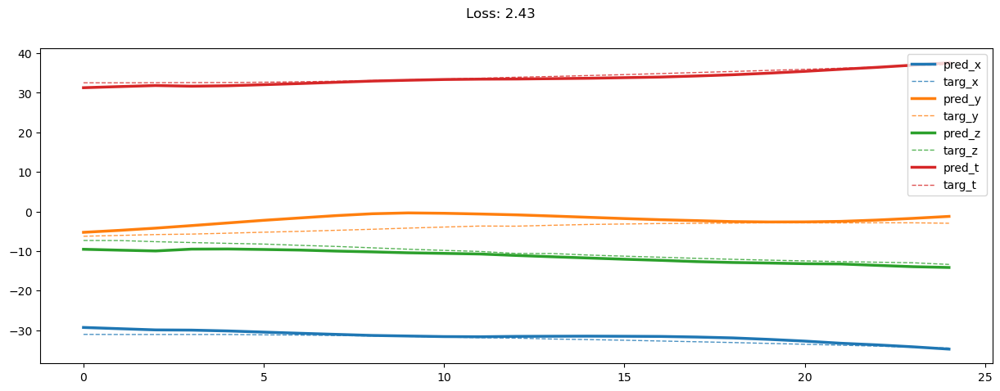

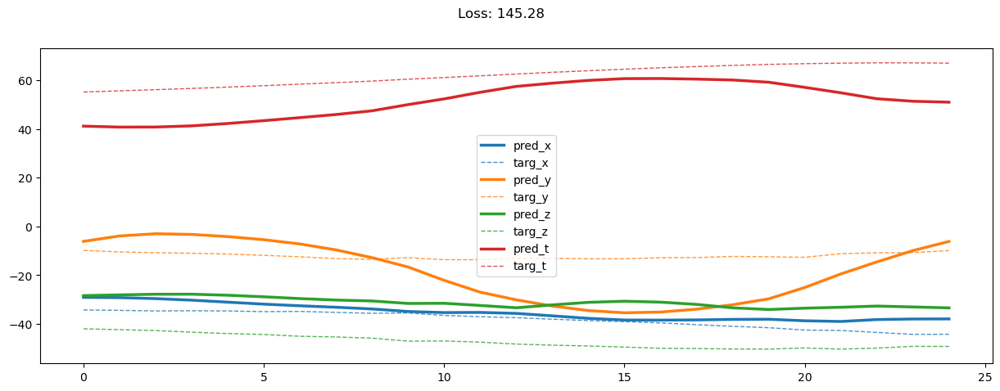

00020: train loss:  98.721, imu loss:  0.125, mag loss:  31.544, div loss:  63.581, slim:  3.576, tlim:  3.436
       valid loss:  163.747, imu loss:  0.093, mag loss:  73.625, div loss:  85.728, slim:  3.569, tlim:  4.545
00040: train loss:  98.767, imu loss:  0.126, mag loss:  31.759, div loss:  63.410, slim:  3.572, tlim:  3.439
       valid loss:  161.903, imu loss:  0.094, mag loss:  72.551, div loss:  85.001, slim:  3.558, tlim:  4.491
00060: train loss:  97.868, imu loss:  0.125, mag loss:  31.575, div loss:  62.701, slim:  3.552, tlim:  3.438
       valid loss:  160.590, imu loss:  0.093, mag loss:  71.214, div loss:  84.975, slim:  3.637, tlim:  4.531
00080: train loss:  97.909, imu loss:  0.125, mag loss:  31.465, div loss:  62.865, slim:  3.573, tlim:  3.415
       valid loss:  161.693, imu loss:  0.093, mag loss:  71.930, div loss:  85.363, slim:  3.605, tlim:  4.541
00100: train loss:  97.984, imu loss:  0.125, mag loss:  31.561, div loss:  62.829, slim:  3.564, tlim:  3.4

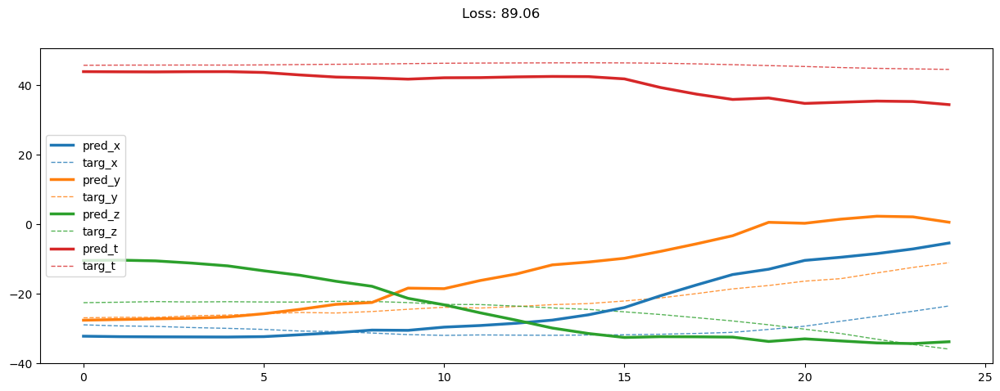

00540: train loss:  94.369, imu loss:  0.125, mag loss:  30.298, div loss:  60.515, slim:  3.597, tlim:  3.377
       valid loss:  165.439, imu loss:  0.093, mag loss:  73.881, div loss:  87.128, slim:  3.730, tlim:  4.539
00560: train loss:  94.322, imu loss:  0.124, mag loss:  30.438, div loss:  60.346, slim:  3.590, tlim:  3.355
       valid loss:  165.338, imu loss:  0.093, mag loss:  73.610, div loss:  87.282, slim:  3.719, tlim:  4.564
00580: train loss:  94.797, imu loss:  0.125, mag loss:  30.405, div loss:  60.864, slim:  3.581, tlim:  3.343
       valid loss:  165.823, imu loss:  0.093, mag loss:  73.920, div loss:  87.501, slim:  3.638, tlim:  4.533


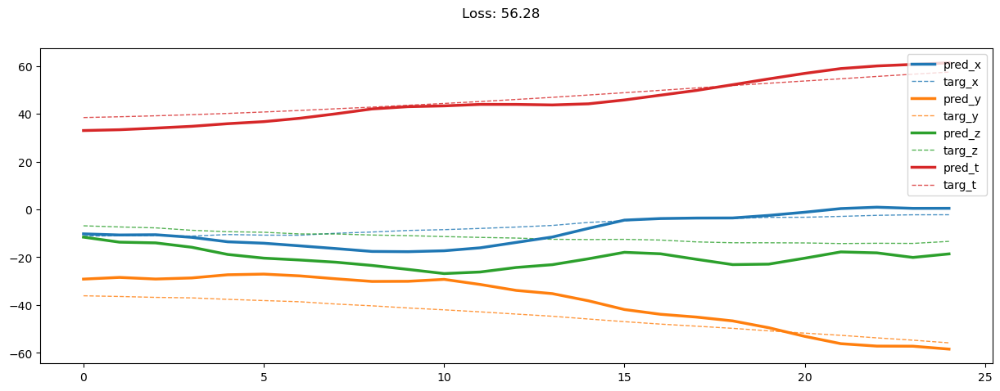

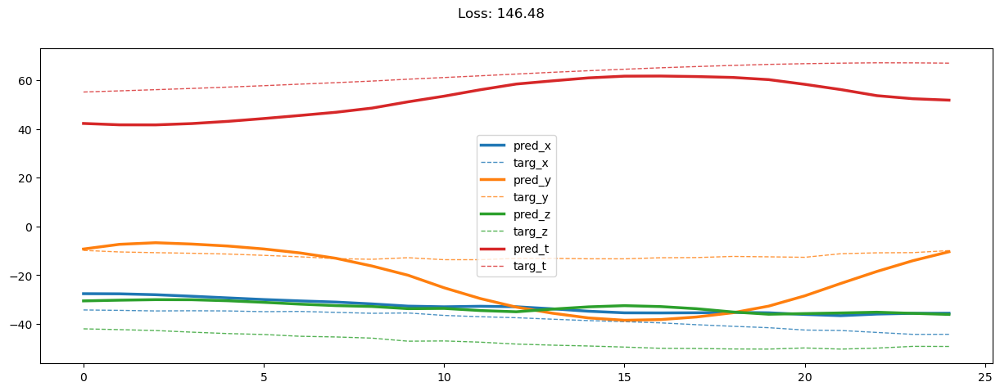

00600: train loss:  93.917, imu loss:  0.124, mag loss:  30.132, div loss:  60.235, slim:  3.586, tlim:  3.372
       valid loss:  164.944, imu loss:  0.093, mag loss:  73.363, div loss:  87.153, slim:  3.727, tlim:  4.538
00620: train loss:  94.976, imu loss:  0.125, mag loss:  30.344, div loss:  61.081, slim:  3.601, tlim:  3.369
       valid loss:  165.343, imu loss:  0.093, mag loss:  73.593, div loss:  87.356, slim:  3.667, tlim:  4.513
00640: train loss:  93.189, imu loss:  0.126, mag loss:  30.056, div loss:  59.591, slim:  3.608, tlim:  3.351
       valid loss:  165.358, imu loss:  0.093, mag loss:  73.586, div loss:  87.371, slim:  3.712, tlim:  4.507
00660: train loss:  93.901, imu loss:  0.125, mag loss:  30.046, div loss:  60.303, slim:  3.601, tlim:  3.369
       valid loss:  164.620, imu loss:  0.093, mag loss:  72.770, div loss:  87.404, slim:  3.778, tlim:  4.544
00680: train loss:  93.845, imu loss:  0.125, mag loss:  30.111, div loss:  60.185, slim:  3.624, tlim:  3.3

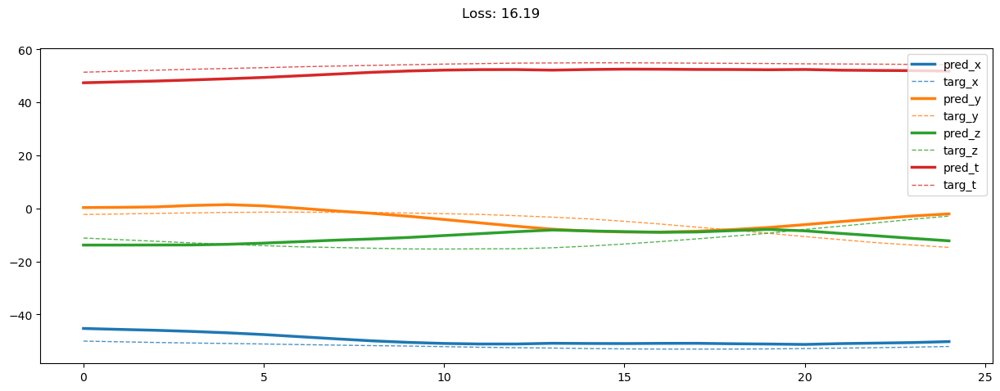

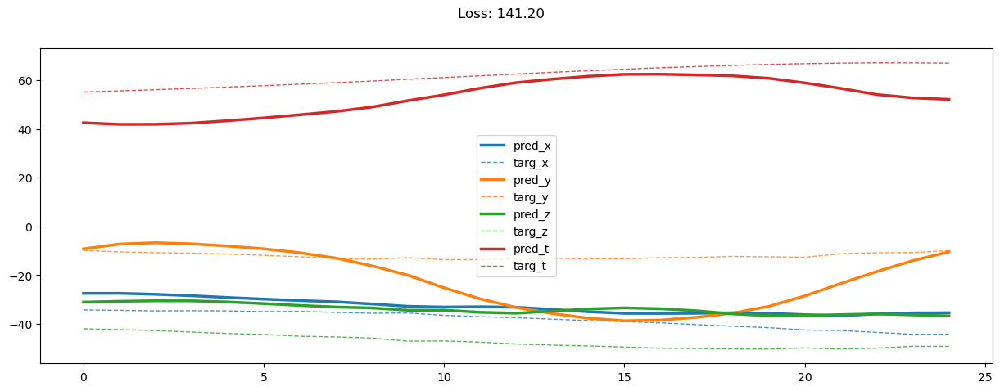

00800: train loss:  93.286, imu loss:  0.126, mag loss:  29.863, div loss:  59.885, slim:  3.610, tlim:  3.345
       valid loss:  166.947, imu loss:  0.093, mag loss:  74.638, div loss:  87.856, slim:  3.778, tlim:  4.556
00820: train loss:  93.425, imu loss:  0.125, mag loss:  29.853, div loss:  60.040, slim:  3.610, tlim:  3.339
       valid loss:  167.748, imu loss:  0.093, mag loss:  75.055, div loss:  88.271, slim:  3.711, tlim:  4.535
00840: train loss:  92.798, imu loss:  0.124, mag loss:  29.798, div loss:  59.466, slim:  3.615, tlim:  3.341
       valid loss:  166.454, imu loss:  0.093, mag loss:  73.686, div loss:  88.288, slim:  3.803, tlim:  4.582
00860: train loss:  92.154, imu loss:  0.124, mag loss:  29.577, div loss:  59.056, slim:  3.607, tlim:  3.326
       valid loss:  166.943, imu loss:  0.093, mag loss:  73.916, div loss:  88.585, slim:  3.784, tlim:  4.538
00880: train loss:  92.308, imu loss:  0.125, mag loss:  29.539, div loss:  59.242, slim:  3.623, tlim:  3.3

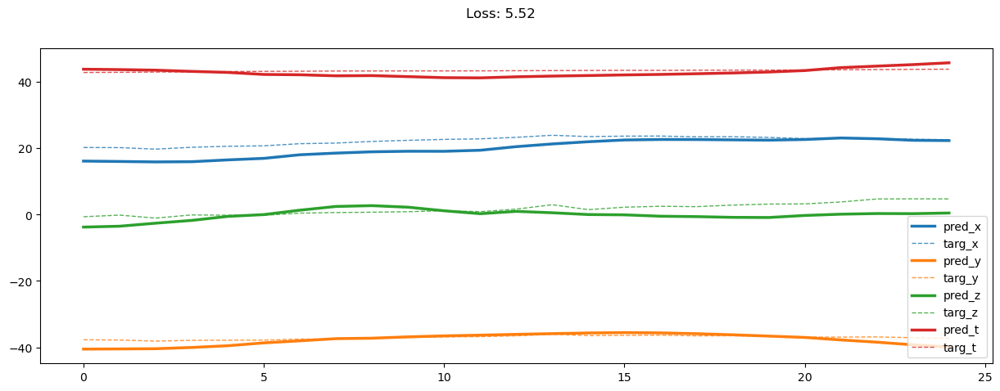

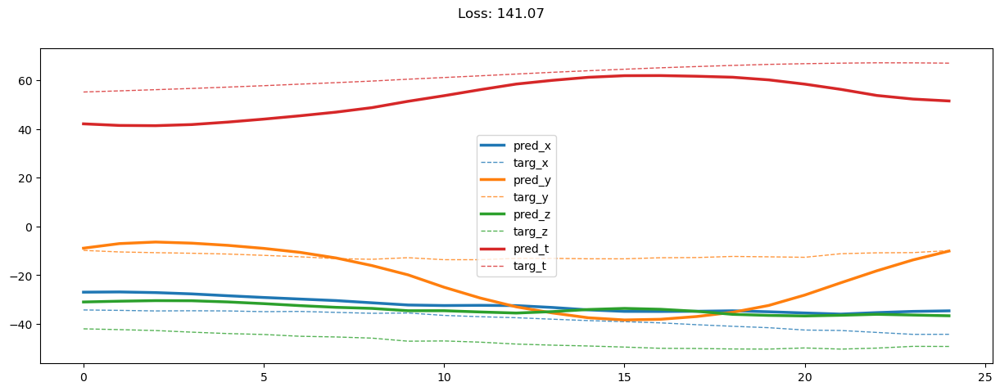

01000: train loss:  91.458, imu loss:  0.125, mag loss:  29.398, div loss:  58.525, slim:  3.642, tlim:  3.333
       valid loss:  167.522, imu loss:  0.092, mag loss:  74.385, div loss:  88.679, slim:  3.798, tlim:  4.555
01020: train loss:  91.783, imu loss:  0.125, mag loss:  29.427, div loss:  58.806, slim:  3.687, tlim:  3.337
       valid loss:  167.609, imu loss:  0.092, mag loss:  74.709, div loss:  88.438, slim:  3.741, tlim:  4.579
01040: train loss:  91.495, imu loss:  0.124, mag loss:  29.313, div loss:  58.649, slim:  3.634, tlim:  3.334
       valid loss:  167.494, imu loss:  0.092, mag loss:  74.215, div loss:  88.843, slim:  3.756, tlim:  4.539
01060: train loss:  91.517, imu loss:  0.125, mag loss:  29.269, div loss:  58.723, slim:  3.629, tlim:  3.326
       valid loss:  168.357, imu loss:  0.092, mag loss:  74.580, div loss:  89.301, slim:  3.774, tlim:  4.588
01080: train loss:  90.720, imu loss:  0.124, mag loss:  29.177, div loss:  58.012, slim:  3.684, tlim:  3.3

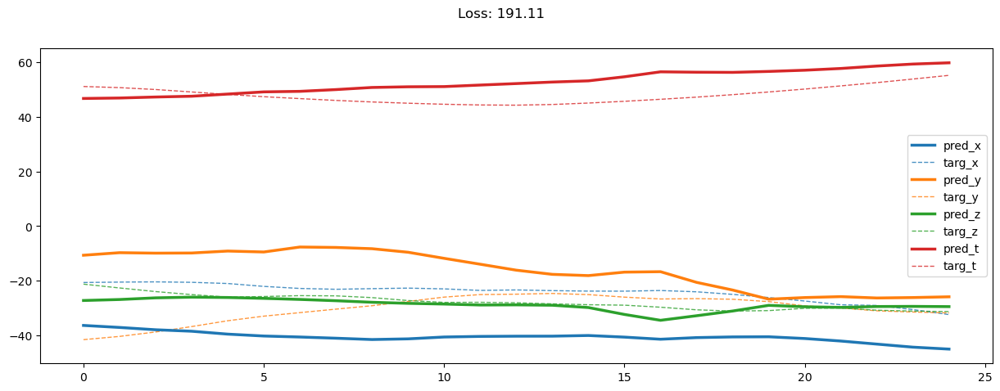

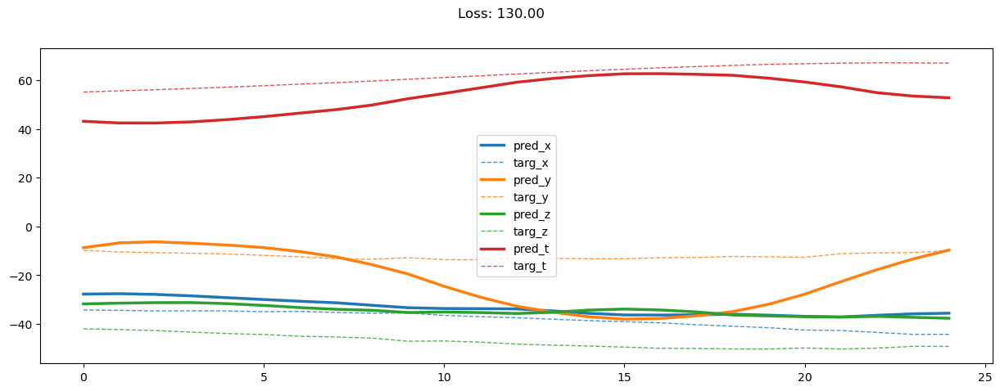

01200: train loss:  89.766, imu loss:  0.124, mag loss:  28.943, div loss:  57.315, slim:  3.649, tlim:  3.294
       valid loss:  168.938, imu loss:  0.092, mag loss:  74.615, div loss:  89.835, slim:  3.820, tlim:  4.589
01220: train loss:  89.991, imu loss:  0.124, mag loss:  28.886, div loss:  57.584, slim:  3.685, tlim:  3.301
       valid loss:  170.161, imu loss:  0.092, mag loss:  75.376, div loss:  90.290, slim:  3.808, tlim:  4.601
01240: train loss:  90.434, imu loss:  0.124, mag loss:  29.010, div loss:  57.896, slim:  3.675, tlim:  3.313
       valid loss:  169.696, imu loss:  0.092, mag loss:  75.230, div loss:  89.978, slim:  3.834, tlim:  4.583
01260: train loss:  90.279, imu loss:  0.125, mag loss:  28.991, div loss:  57.770, slim:  3.669, tlim:  3.302
       valid loss:  169.796, imu loss:  0.092, mag loss:  74.963, div loss:  90.372, slim:  3.795, tlim:  4.559
01280: train loss:  89.815, imu loss:  0.125, mag loss:  28.856, div loss:  57.447, slim:  3.658, tlim:  3.2

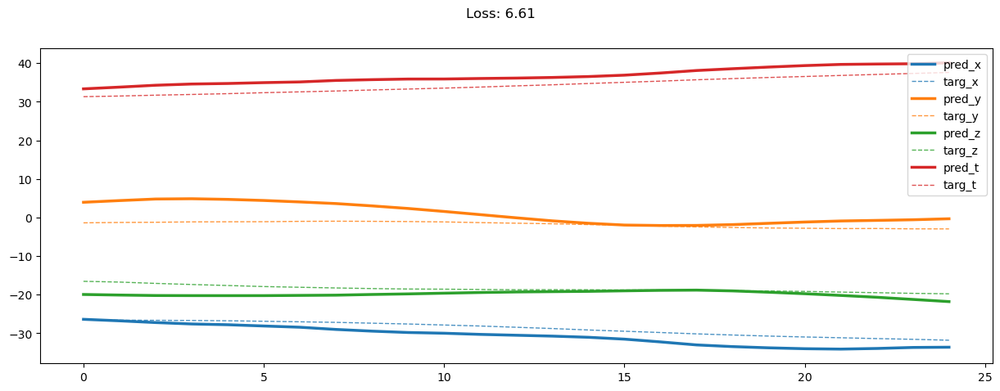

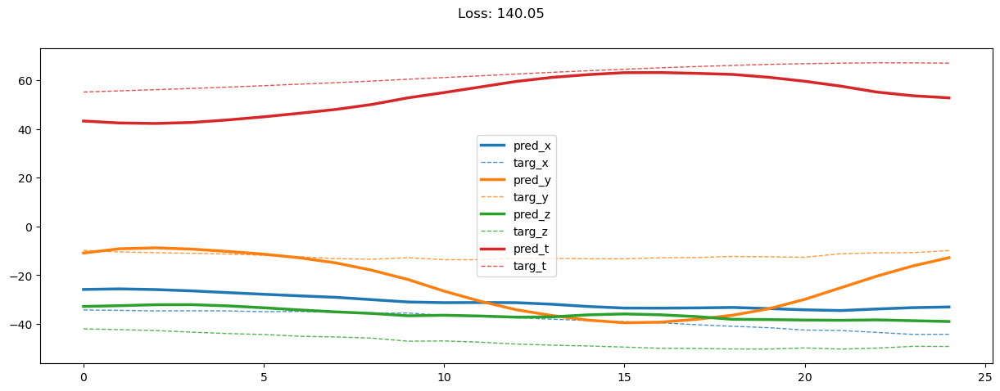

01400: train loss:  88.676, imu loss:  0.124, mag loss:  28.479, div loss:  56.693, slim:  3.658, tlim:  3.287
       valid loss:  171.746, imu loss:  0.092, mag loss:  76.115, div loss:  91.144, slim:  3.819, tlim:  4.588
01420: train loss:  88.806, imu loss:  0.124, mag loss:  28.475, div loss:  56.814, slim:  3.705, tlim:  3.289
       valid loss:  170.320, imu loss:  0.092, mag loss:  75.136, div loss:  90.646, slim:  3.910, tlim:  4.624
01440: train loss:  89.213, imu loss:  0.124, mag loss:  28.586, div loss:  57.113, slim:  3.681, tlim:  3.293
       valid loss:  168.508, imu loss:  0.092, mag loss:  73.952, div loss:  90.024, slim:  3.916, tlim:  4.616
01460: train loss:  88.327, imu loss:  0.125, mag loss:  28.355, div loss:  56.456, slim:  3.688, tlim:  3.292
       valid loss:  171.209, imu loss:  0.092, mag loss:  75.647, div loss:  91.001, slim:  3.921, tlim:  4.652
01480: train loss:  88.464, imu loss:  0.124, mag loss:  28.478, div loss:  56.476, slim:  3.693, tlim:  3.2

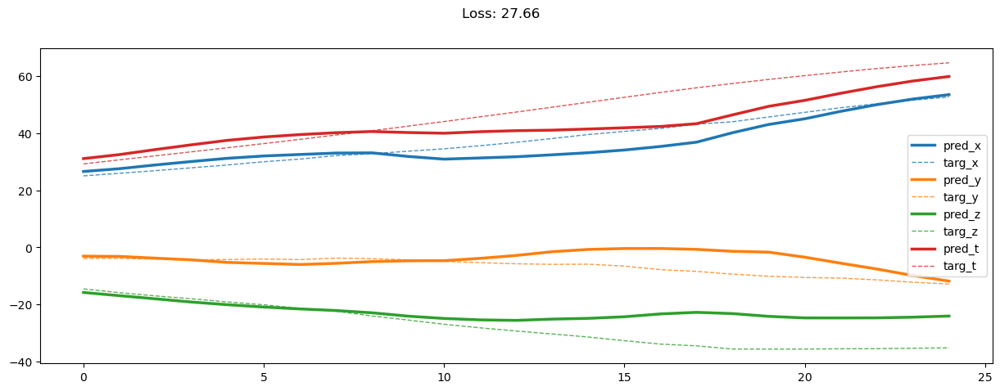

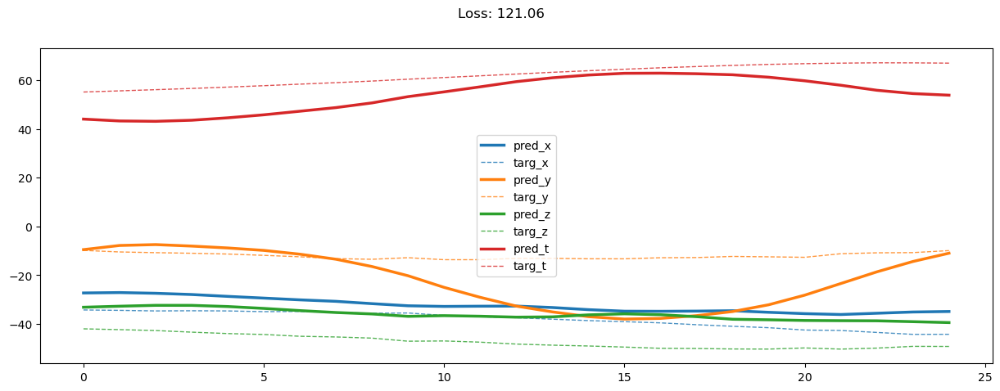

01600: train loss:  88.338, imu loss:  0.125, mag loss:  28.312, div loss:  56.514, slim:  3.726, tlim:  3.274
       valid loss:  173.684, imu loss:  0.092, mag loss:  77.339, div loss:  91.798, slim:  3.867, tlim:  4.651
01620: train loss:  87.263, imu loss:  0.124, mag loss:  28.015, div loss:  55.746, slim:  3.707, tlim:  3.268
       valid loss:  172.443, imu loss:  0.092, mag loss:  75.873, div loss:  92.085, slim:  3.877, tlim:  4.566
01640: train loss:  87.623, imu loss:  0.124, mag loss:  28.078, div loss:  56.060, slim:  3.701, tlim:  3.250
       valid loss:  172.627, imu loss:  0.092, mag loss:  76.126, div loss:  91.959, slim:  3.899, tlim:  4.633
01660: train loss:  86.978, imu loss:  0.124, mag loss:  27.941, div loss:  55.525, slim:  3.738, tlim:  3.272
       valid loss:  171.700, imu loss:  0.092, mag loss:  75.686, div loss:  91.494, slim:  3.899, tlim:  4.605
01680: train loss:  86.127, imu loss:  0.124, mag loss:  27.652, div loss:  55.000, slim:  3.688, tlim:  3.2

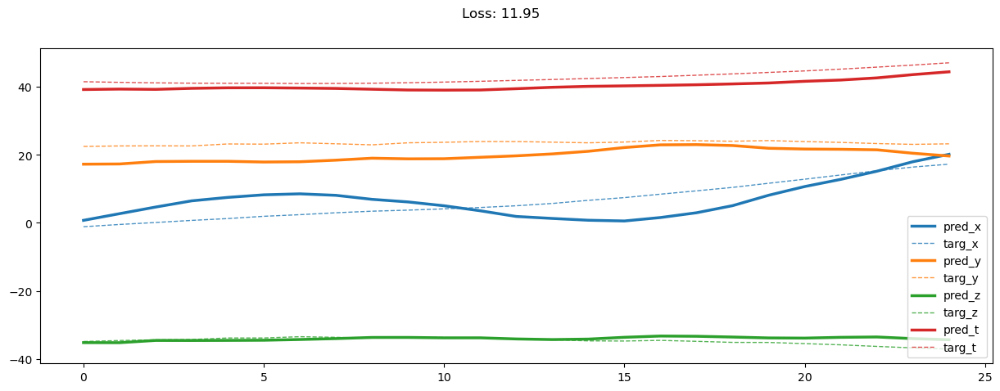

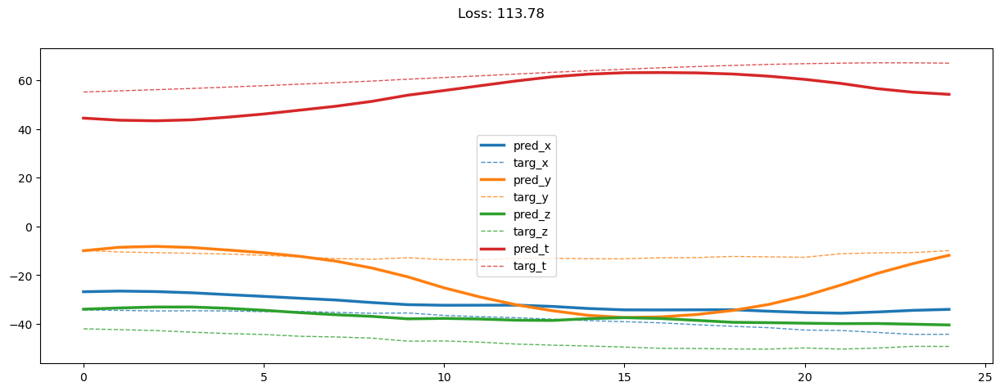

01800: train loss:  86.474, imu loss:  0.124, mag loss:  27.739, div loss:  55.238, slim:  3.719, tlim:  3.259
       valid loss:  172.536, imu loss:  0.092, mag loss:  75.457, div loss:  92.525, slim:  3.911, tlim:  4.647
01820: train loss:  86.123, imu loss:  0.124, mag loss:  27.602, div loss:  55.044, slim:  3.713, tlim:  3.233
       valid loss:  173.983, imu loss:  0.092, mag loss:  76.795, div loss:  92.677, slim:  3.856, tlim:  4.607
01840: train loss:  86.623, imu loss:  0.124, mag loss:  27.827, div loss:  55.301, slim:  3.743, tlim:  3.246
       valid loss:  173.194, imu loss:  0.092, mag loss:  76.276, div loss:  92.388, slim:  3.864, tlim:  4.630
01860: train loss:  85.666, imu loss:  0.125, mag loss:  27.577, div loss:  54.607, slim:  3.702, tlim:  3.243
       valid loss:  172.651, imu loss:  0.091, mag loss:  75.397, div loss:  92.748, slim:  3.871, tlim:  4.595
01880: train loss:  86.311, imu loss:  0.124, mag loss:  27.630, div loss:  55.190, slim:  3.717, tlim:  3.2

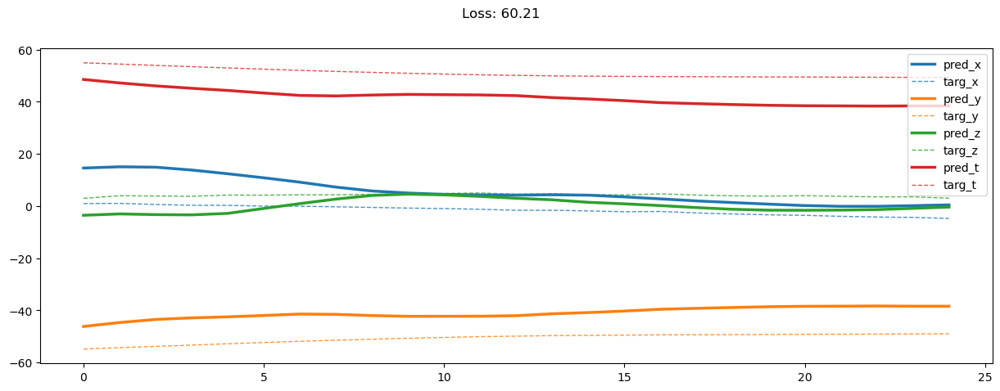

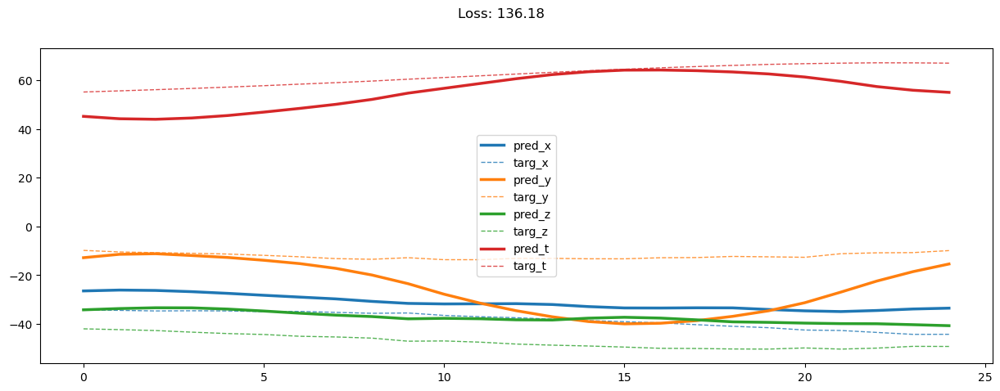

02000: train loss:  84.506, imu loss:  0.124, mag loss:  27.069, div loss:  53.967, slim:  3.757, tlim:  3.209
       valid loss:  175.538, imu loss:  0.091, mag loss:  77.001, div loss:  94.006, slim:  3.852, tlim:  4.635
02020: train loss:  85.170, imu loss:  0.125, mag loss:  27.297, div loss:  54.388, slim:  3.735, tlim:  3.235
       valid loss:  175.699, imu loss:  0.092, mag loss:  76.546, div loss:  94.599, slim:  3.945, tlim:  4.635
02040: train loss:  85.529, imu loss:  0.124, mag loss:  27.300, div loss:  54.752, slim:  3.732, tlim:  3.227
       valid loss:  175.300, imu loss:  0.091, mag loss:  76.862, div loss:  93.914, slim:  3.905, tlim:  4.608
02060: train loss:  85.492, imu loss:  0.124, mag loss:  27.369, div loss:  54.631, slim:  3.752, tlim:  3.240
       valid loss:  175.442, imu loss:  0.091, mag loss:  77.201, div loss:  93.695, slim:  3.943, tlim:  4.625
02080: train loss:  84.084, imu loss:  0.124, mag loss:  27.000, div loss:  53.615, slim:  3.739, tlim:  3.2

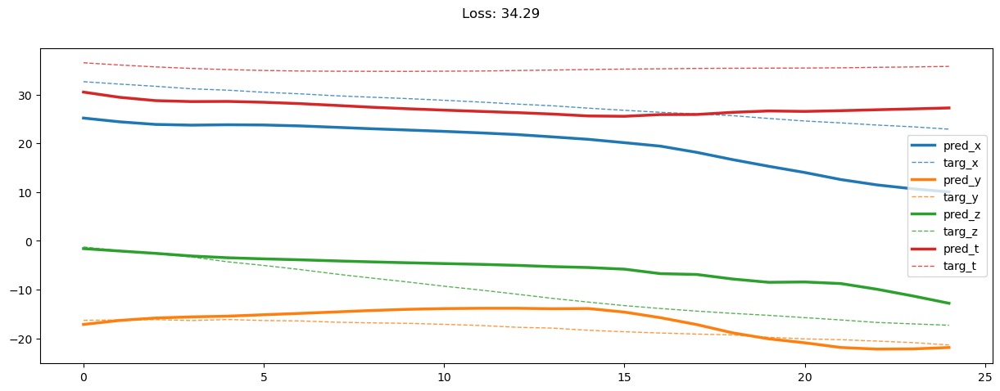

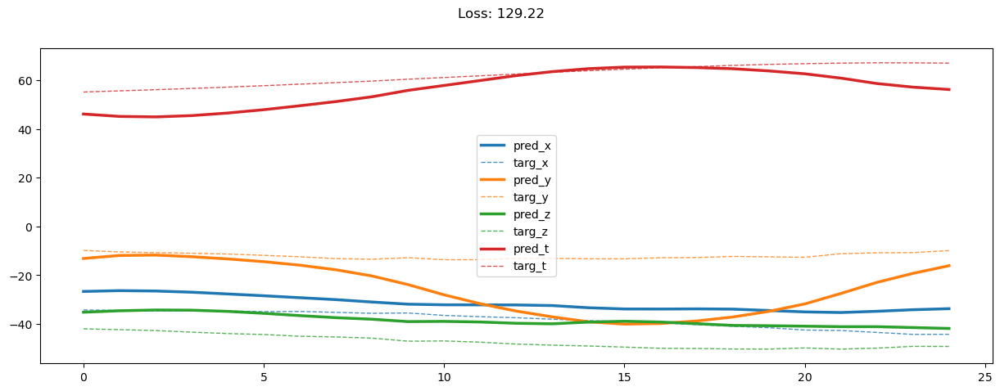

02200: train loss:  83.505, imu loss:  0.124, mag loss:  26.865, div loss:  53.173, slim:  3.760, tlim:  3.203
       valid loss:  177.610, imu loss:  0.091, mag loss:  77.821, div loss:  95.240, slim:  4.004, tlim:  4.608
02220: train loss:  83.831, imu loss:  0.124, mag loss:  26.800, div loss:  53.575, slim:  3.752, tlim:  3.192
       valid loss:  178.480, imu loss:  0.091, mag loss:  78.448, div loss:  95.473, slim:  4.020, tlim:  4.618
02240: train loss:  83.690, imu loss:  0.124, mag loss:  26.789, div loss:  53.435, slim:  3.791, tlim:  3.191
       valid loss:  179.551, imu loss:  0.091, mag loss:  78.526, div loss:  96.474, slim:  3.967, tlim:  4.623
02260: train loss:  84.124, imu loss:  0.125, mag loss:  26.823, div loss:  53.833, slim:  3.780, tlim:  3.197
       valid loss:  179.243, imu loss:  0.091, mag loss:  78.506, div loss:  96.147, slim:  4.002, tlim:  4.665
02280: train loss:  84.147, imu loss:  0.124, mag loss:  26.848, div loss:  53.827, slim:  3.775, tlim:  3.2

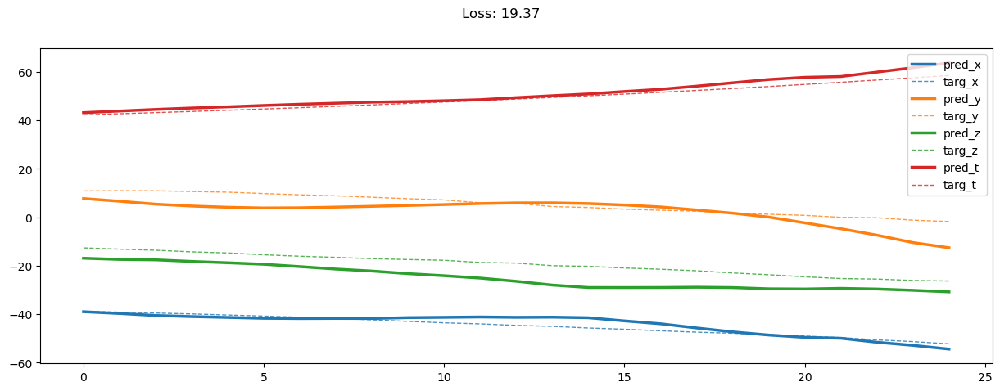

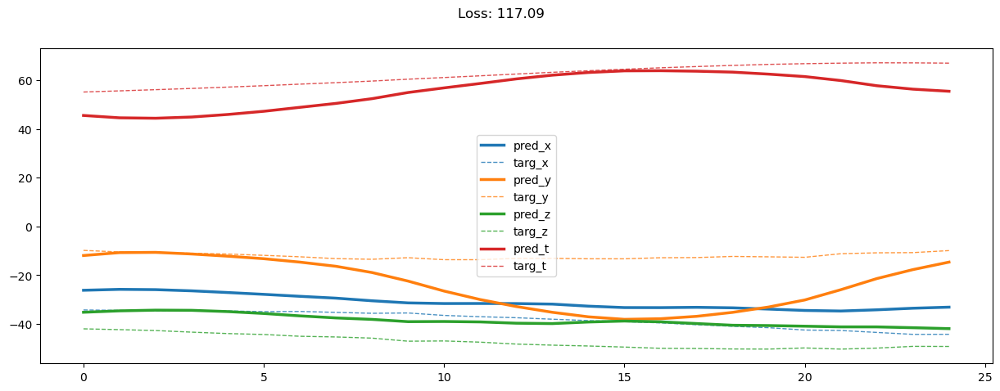

02400: train loss:  82.419, imu loss:  0.124, mag loss:  26.423, div loss:  52.541, slim:  3.812, tlim:  3.171
       valid loss:  180.481, imu loss:  0.091, mag loss:  79.147, div loss:  96.747, slim:  3.963, tlim:  4.673
02420: train loss:  82.591, imu loss:  0.124, mag loss:  26.450, div loss:  52.696, slim:  3.759, tlim:  3.175
       valid loss:  179.516, imu loss:  0.091, mag loss:  77.983, div loss:  96.944, slim:  4.024, tlim:  4.656
02440: train loss:  81.915, imu loss:  0.124, mag loss:  26.205, div loss:  52.265, slim:  3.766, tlim:  3.173
       valid loss:  181.008, imu loss:  0.091, mag loss:  79.286, div loss:  97.089, slim:  4.091, tlim:  4.691
02460: train loss:  82.329, imu loss:  0.124, mag loss:  26.348, div loss:  52.541, slim:  3.748, tlim:  3.172
       valid loss:  181.058, imu loss:  0.092, mag loss:  79.000, div loss:  97.473, slim:  4.012, tlim:  4.654
02480: train loss:  82.632, imu loss:  0.124, mag loss:  26.319, div loss:  52.877, slim:  3.756, tlim:  3.1

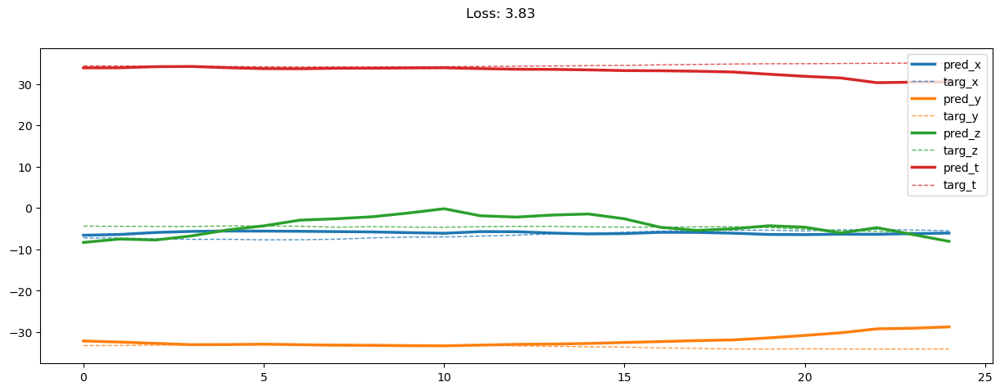

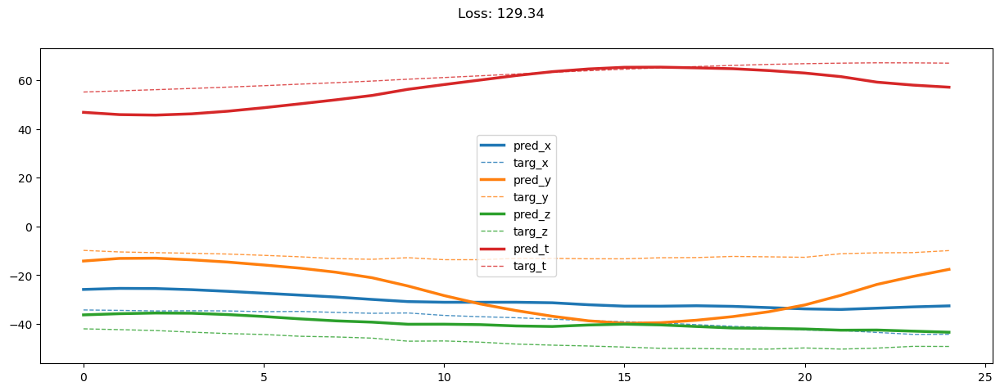

02600: train loss:  82.049, imu loss:  0.124, mag loss:  26.160, div loss:  52.455, slim:  3.784, tlim:  3.152
       valid loss:  183.290, imu loss:  0.091, mag loss:  79.569, div loss:  99.116, slim:  4.039, tlim:  4.673
02620: train loss:  81.649, imu loss:  0.124, mag loss:  26.070, div loss:  52.138, slim:  3.789, tlim:  3.160
       valid loss:  182.759, imu loss:  0.091, mag loss:  79.448, div loss:  98.709, slim:  4.015, tlim:  4.676
02640: train loss:  80.945, imu loss:  0.124, mag loss:  25.871, div loss:  51.631, slim:  3.791, tlim:  3.160
       valid loss:  183.136, imu loss:  0.091, mag loss:  79.494, div loss:  99.022, slim:  4.101, tlim:  4.672
02660: train loss:  81.392, imu loss:  0.124, mag loss:  25.982, div loss:  51.972, slim:  3.796, tlim:  3.154
       valid loss:  181.938, imu loss:  0.091, mag loss:  78.938, div loss:  98.364, slim:  4.105, tlim:  4.691
02680: train loss:  80.456, imu loss:  0.124, mag loss:  25.844, div loss:  51.173, slim:  3.796, tlim:  3.1

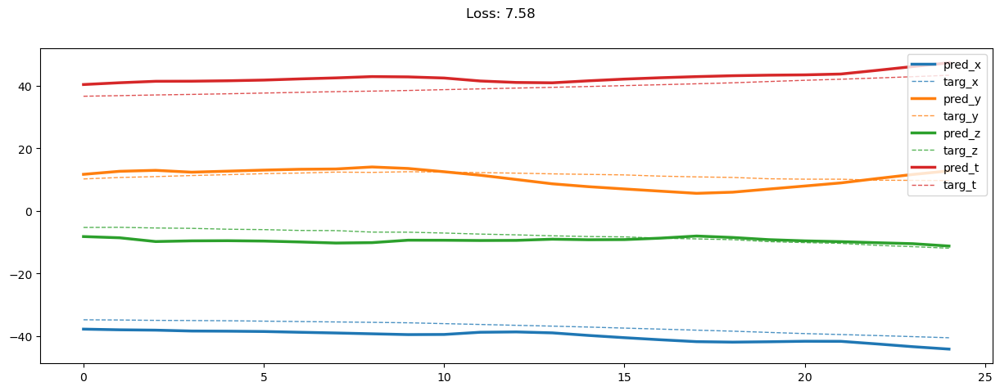

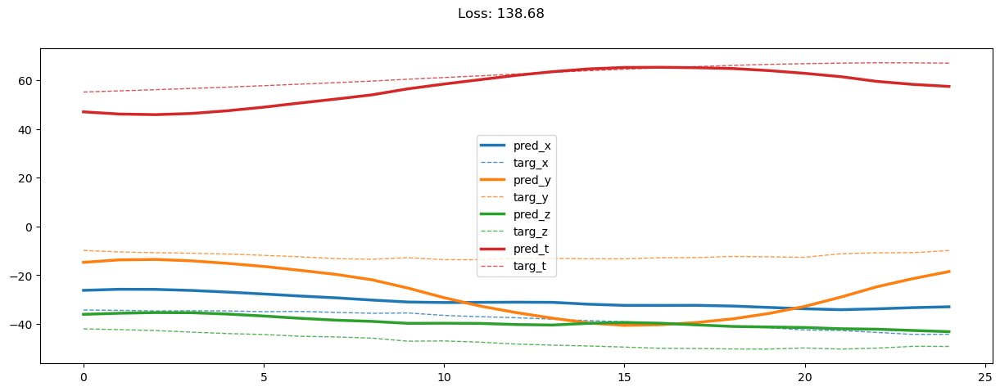

02800: train loss:  79.646, imu loss:  0.124, mag loss:  25.548, div loss:  50.675, slim:  3.781, tlim:  3.139
       valid loss:  185.318, imu loss:  0.091, mag loss:  80.586, div loss:  100.083, slim:  4.077, tlim:  4.720
02820: train loss:  80.005, imu loss:  0.124, mag loss:  25.491, div loss:  51.079, slim:  3.806, tlim:  3.147
       valid loss:  184.875, imu loss:  0.091, mag loss:  80.112, div loss:  100.132, slim:  4.042, tlim:  4.705
02840: train loss:  80.331, imu loss:  0.123, mag loss:  25.794, div loss:  51.113, slim:  3.798, tlim:  3.135
       valid loss:  186.892, imu loss:  0.091, mag loss:  81.776, div loss:  100.457, slim:  4.091, tlim:  4.726
02860: train loss:  80.327, imu loss:  0.124, mag loss:  25.674, div loss:  51.213, slim:  3.810, tlim:  3.150
       valid loss:  185.044, imu loss:  0.091, mag loss:  80.275, div loss:  100.173, slim:  4.047, tlim:  4.657
02880: train loss:  79.346, imu loss:  0.125, mag loss:  25.354, div loss:  50.571, slim:  3.823, tlim: 

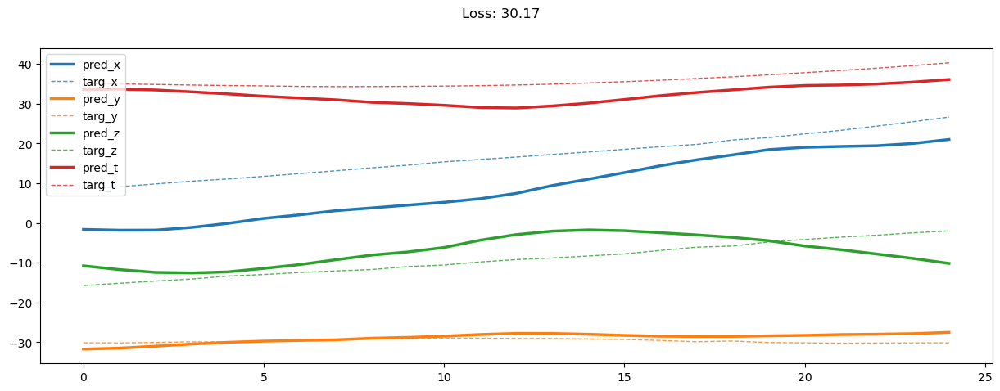

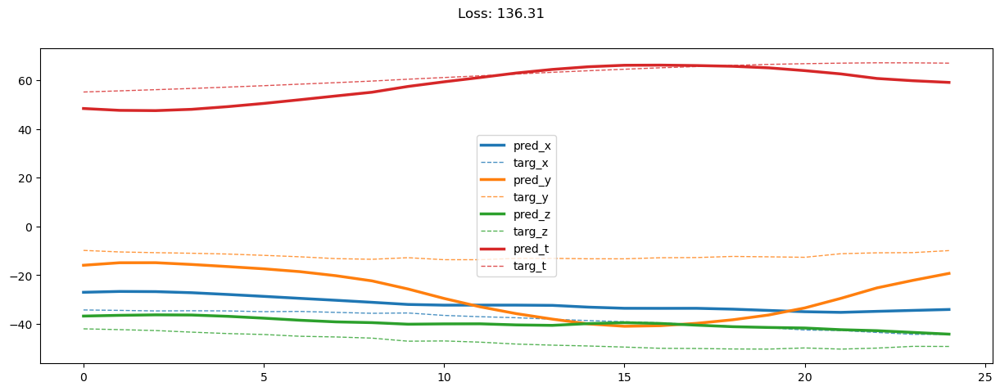

03000: train loss:  79.204, imu loss:  0.124, mag loss:  25.252, div loss:  50.523, slim:  3.809, tlim:  3.137
       valid loss:  188.352, imu loss:  0.091, mag loss:  81.920, div loss:  101.784, slim:  4.115, tlim:  4.704
03020: train loss:  79.021, imu loss:  0.124, mag loss:  25.281, div loss:  50.331, slim:  3.775, tlim:  3.121
       valid loss:  187.457, imu loss:  0.091, mag loss:  80.941, div loss:  101.867, slim:  4.106, tlim:  4.708
03040: train loss:  79.009, imu loss:  0.125, mag loss:  25.169, div loss:  50.421, slim:  3.819, tlim:  3.120
       valid loss:  188.505, imu loss:  0.091, mag loss:  82.215, div loss:  101.640, slim:  4.152, tlim:  4.694
03060: train loss:  78.753, imu loss:  0.124, mag loss:  25.099, div loss:  50.215, slim:  3.854, tlim:  3.135
       valid loss:  186.650, imu loss:  0.091, mag loss:  80.811, div loss:  101.135, slim:  4.222, tlim:  4.743
03080: train loss:  78.709, imu loss:  0.124, mag loss:  25.100, div loss:  50.195, slim:  3.813, tlim: 

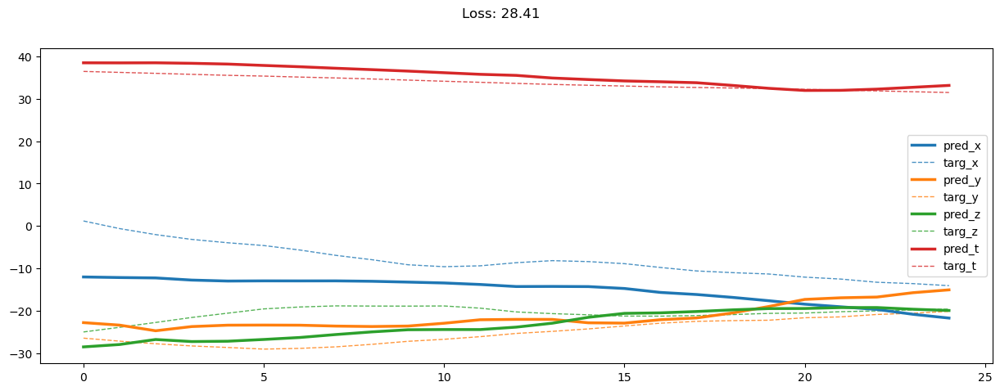

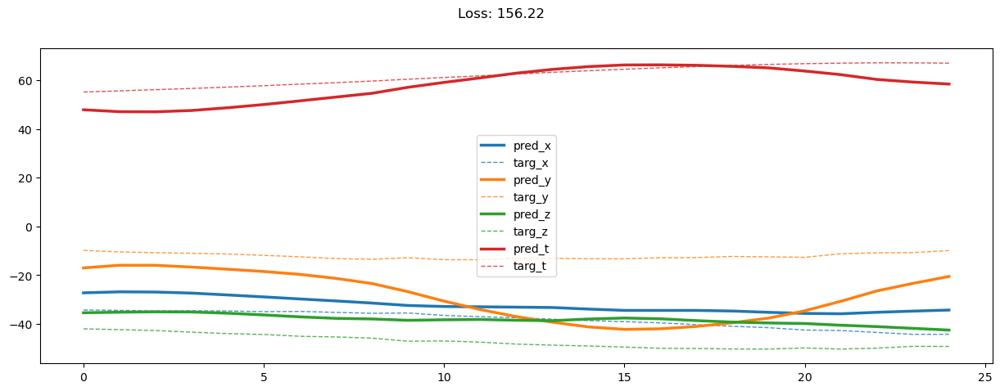

03200: train loss:  77.702, imu loss:  0.124, mag loss:  24.795, div loss:  49.513, slim:  3.837, tlim:  3.083
       valid loss:  191.667, imu loss:  0.091, mag loss:  84.100, div loss:  102.912, slim:  4.110, tlim:  4.715
03220: train loss:  78.048, imu loss:  0.123, mag loss:  24.878, div loss:  49.739, slim:  3.871, tlim:  3.120
       valid loss:  189.898, imu loss:  0.091, mag loss:  82.653, div loss:  102.573, slim:  4.153, tlim:  4.723
03240: train loss:  77.168, imu loss:  0.124, mag loss:  24.671, div loss:  49.107, slim:  3.816, tlim:  3.084
       valid loss:  190.841, imu loss:  0.091, mag loss:  82.713, div loss:  103.425, slim:  4.174, tlim:  4.757
03260: train loss:  77.088, imu loss:  0.124, mag loss:  24.645, div loss:  49.049, slim:  3.861, tlim:  3.073
       valid loss:  191.744, imu loss:  0.091, mag loss:  83.270, div loss:  103.800, slim:  4.183, tlim:  4.716
03280: train loss:  76.601, imu loss:  0.124, mag loss:  24.415, div loss:  48.771, slim:  3.861, tlim: 

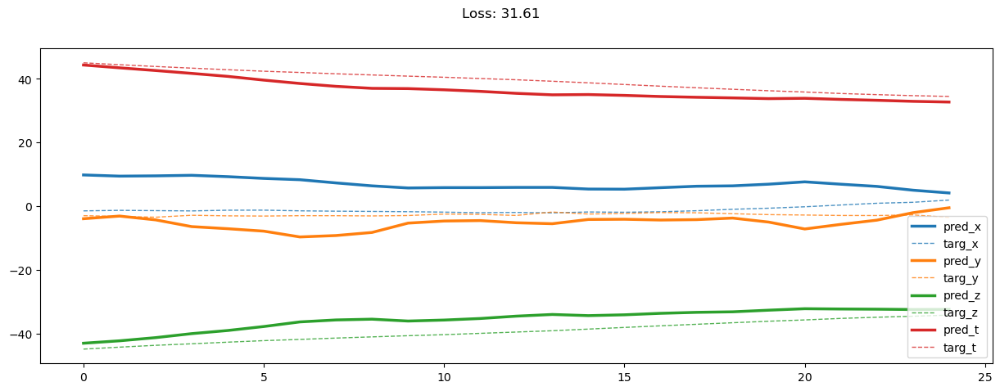

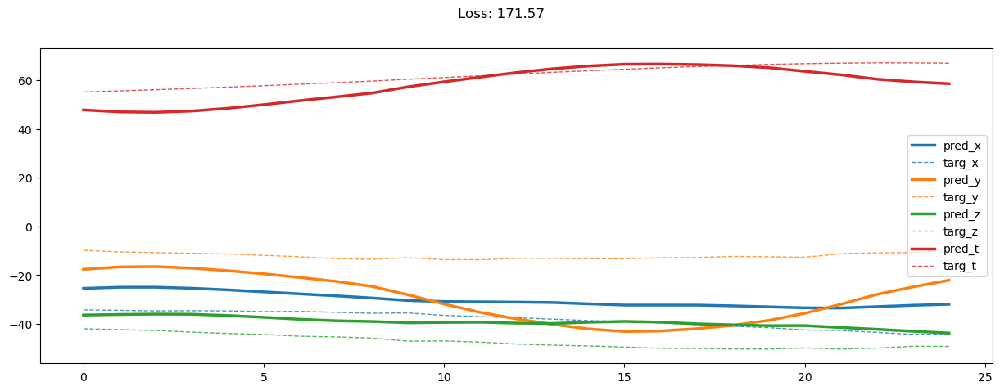

03400: train loss:  76.482, imu loss:  0.124, mag loss:  24.434, div loss:  48.643, slim:  3.854, tlim:  3.089
       valid loss:  193.664, imu loss:  0.091, mag loss:  84.188, div loss:  104.779, slim:  4.131, tlim:  4.764
03420: train loss:  76.564, imu loss:  0.124, mag loss:  24.398, div loss:  48.783, slim:  3.814, tlim:  3.074
       valid loss:  193.322, imu loss:  0.091, mag loss:  83.919, div loss:  104.712, slim:  4.186, tlim:  4.738
03440: train loss:  76.532, imu loss:  0.124, mag loss:  24.345, div loss:  48.790, slim:  3.865, tlim:  3.076
       valid loss:  192.676, imu loss:  0.091, mag loss:  83.516, div loss:  104.461, slim:  4.211, tlim:  4.740
03460: train loss:  76.699, imu loss:  0.124, mag loss:  24.507, div loss:  48.794, slim:  3.852, tlim:  3.080
       valid loss:  193.940, imu loss:  0.091, mag loss:  83.936, div loss:  105.316, slim:  4.185, tlim:  4.733
03480: train loss:  76.905, imu loss:  0.124, mag loss:  24.397, div loss:  49.112, slim:  3.852, tlim: 

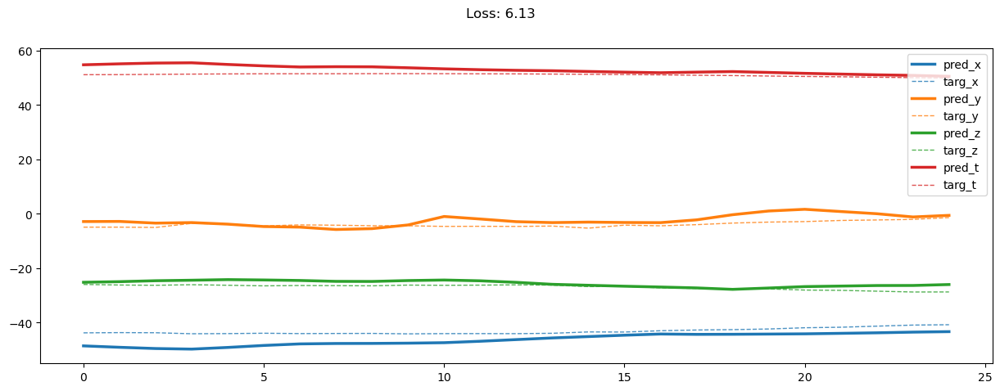

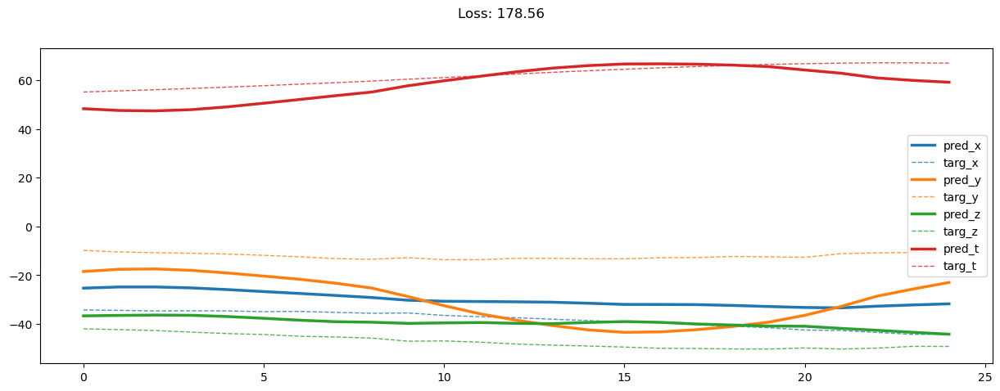

03600: train loss:  75.638, imu loss:  0.124, mag loss:  24.139, div loss:  48.113, slim:  3.883, tlim:  3.055
       valid loss:  195.822, imu loss:  0.091, mag loss:  84.933, div loss:  106.141, slim:  4.271, tlim:  4.784
03620: train loss:  75.213, imu loss:  0.124, mag loss:  24.051, div loss:  47.773, slim:  3.865, tlim:  3.066
       valid loss:  195.936, imu loss:  0.091, mag loss:  85.087, div loss:  106.132, slim:  4.173, tlim:  4.777
03640: train loss:  75.368, imu loss:  0.125, mag loss:  24.044, div loss:  47.947, slim:  3.856, tlim:  3.051
       valid loss:  194.977, imu loss:  0.092, mag loss:  85.197, div loss:  105.072, slim:  4.177, tlim:  4.762
03660: train loss:  75.851, imu loss:  0.124, mag loss:  24.108, div loss:  48.367, slim:  3.849, tlim:  3.053
       valid loss:  197.146, imu loss:  0.091, mag loss:  85.749, div loss:  106.670, slim:  4.228, tlim:  4.771
03680: train loss:  75.238, imu loss:  0.124, mag loss:  24.011, div loss:  47.847, slim:  3.856, tlim: 

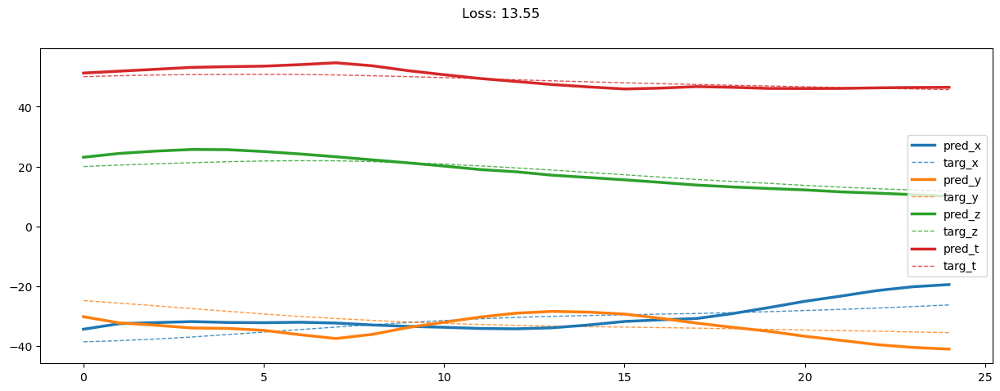

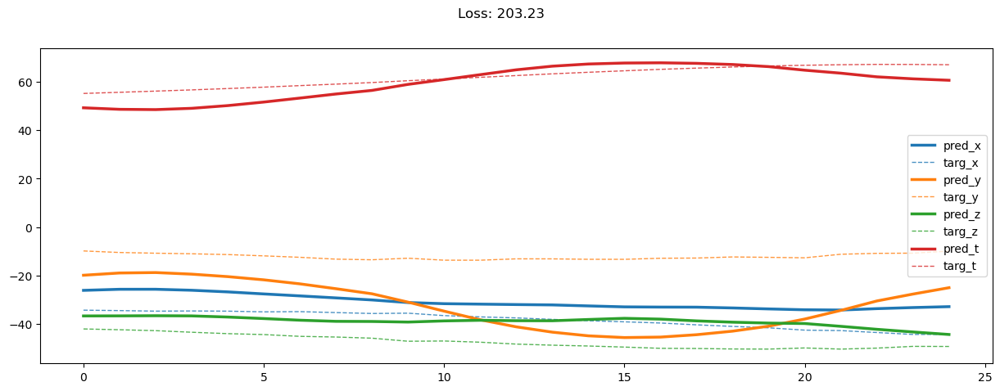

03800: train loss:  74.155, imu loss:  0.124, mag loss:  23.677, div loss:  47.087, slim:  3.891, tlim:  3.059
       valid loss:  196.167, imu loss:  0.091, mag loss:  85.461, div loss:  105.978, slim:  4.236, tlim:  4.771
03820: train loss:  74.364, imu loss:  0.124, mag loss:  23.744, div loss:  47.252, slim:  3.870, tlim:  3.036
       valid loss:  196.358, imu loss:  0.091, mag loss:  85.137, div loss:  106.475, slim:  4.253, tlim:  4.788
03840: train loss:  74.574, imu loss:  0.124, mag loss:  23.723, div loss:  47.474, slim:  3.893, tlim:  3.039
       valid loss:  195.999, imu loss:  0.091, mag loss:  84.665, div loss:  106.566, slim:  4.306, tlim:  4.801
03860: train loss:  74.790, imu loss:  0.124, mag loss:  23.791, div loss:  47.626, slim:  3.878, tlim:  3.040
       valid loss:  197.879, imu loss:  0.091, mag loss:  86.118, div loss:  106.983, slim:  4.295, tlim:  4.818
03880: train loss:  73.687, imu loss:  0.124, mag loss:  23.459, div loss:  46.858, slim:  3.887, tlim: 

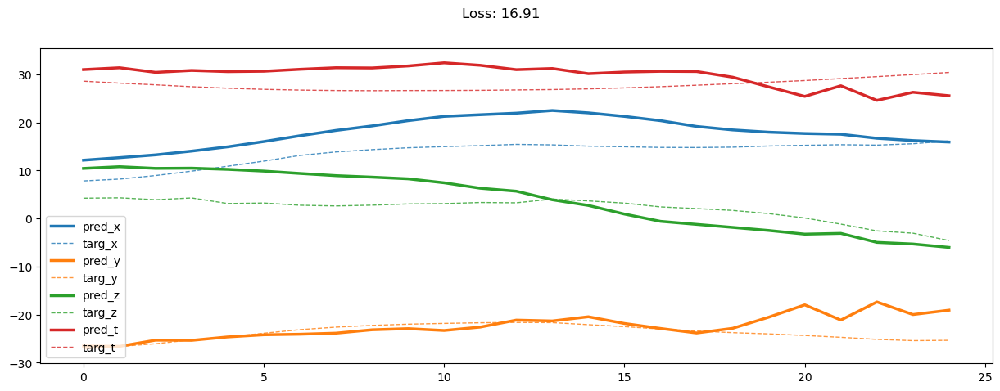

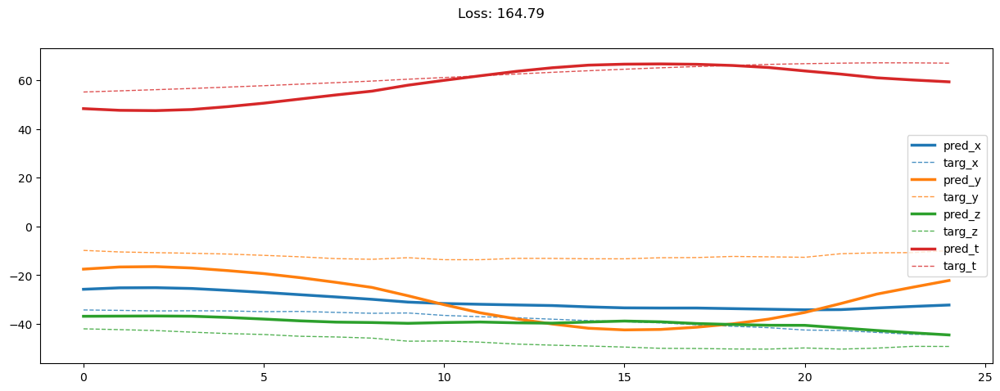

04000: train loss:  73.288, imu loss:  0.124, mag loss:  23.351, div loss:  46.581, slim:  3.896, tlim:  3.010
       valid loss:  199.342, imu loss:  0.091, mag loss:  87.270, div loss:  107.317, slim:  4.231, tlim:  4.808
04020: train loss:  73.496, imu loss:  0.124, mag loss:  23.326, div loss:  46.790, slim:  3.899, tlim:  3.042
       valid loss:  198.257, imu loss:  0.091, mag loss:  86.091, div loss:  107.394, slim:  4.324, tlim:  4.800
04040: train loss:  73.358, imu loss:  0.123, mag loss:  23.266, div loss:  46.741, slim:  3.872, tlim:  3.013
       valid loss:  198.828, imu loss:  0.091, mag loss:  86.258, div loss:  107.849, slim:  4.219, tlim:  4.767
04060: train loss:  73.044, imu loss:  0.124, mag loss:  23.296, div loss:  46.396, slim:  3.857, tlim:  3.019
       valid loss:  201.306, imu loss:  0.091, mag loss:  87.856, div loss:  108.669, slim:  4.333, tlim:  4.809
04080: train loss:  73.059, imu loss:  0.123, mag loss:  23.289, div loss:  46.394, slim:  3.903, tlim: 

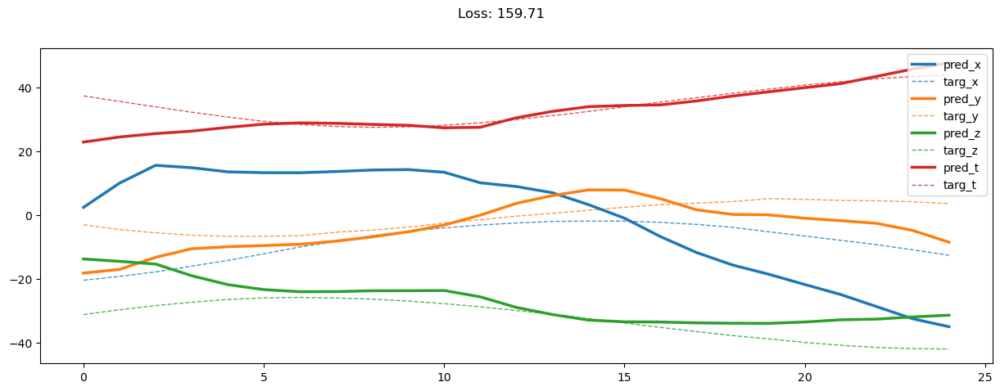

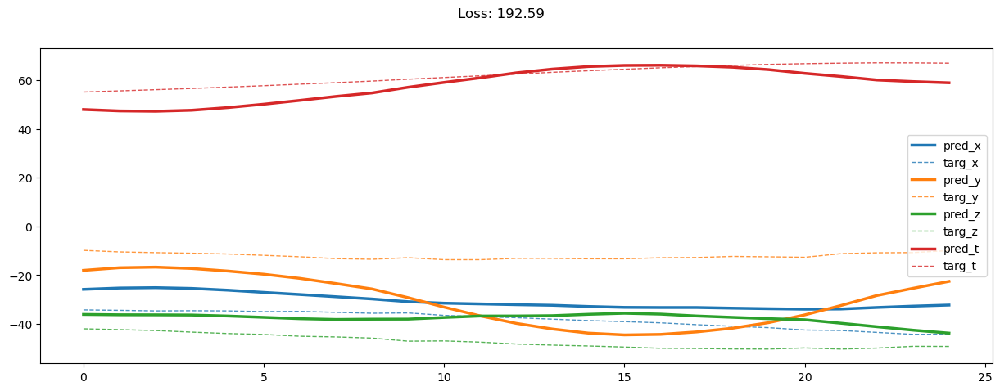

04200: train loss:  72.327, imu loss:  0.124, mag loss:  23.009, div loss:  45.957, slim:  3.939, tlim:  3.003
       valid loss:  201.450, imu loss:  0.091, mag loss:  88.138, div loss:  108.544, slim:  4.297, tlim:  4.803
04220: train loss:  71.905, imu loss:  0.123, mag loss:  22.932, div loss:  45.622, slim:  3.918, tlim:  2.999
       valid loss:  201.192, imu loss:  0.091, mag loss:  87.885, div loss:  108.508, slim:  4.334, tlim:  4.832
04240: train loss:  71.923, imu loss:  0.124, mag loss:  22.922, div loss:  45.653, slim:  3.916, tlim:  2.994
       valid loss:  201.462, imu loss:  0.091, mag loss:  88.029, div loss:  108.639, slim:  4.314, tlim:  4.833
04260: train loss:  72.399, imu loss:  0.123, mag loss:  22.886, div loss:  46.160, slim:  3.903, tlim:  3.004
       valid loss:  200.765, imu loss:  0.091, mag loss:  87.377, div loss:  108.600, slim:  4.347, tlim:  4.814
04280: train loss:  71.912, imu loss:  0.123, mag loss:  22.924, div loss:  45.623, slim:  3.926, tlim: 

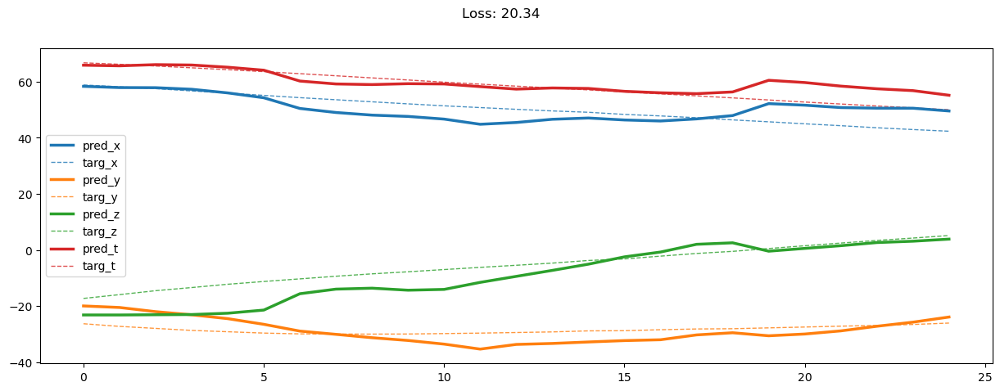

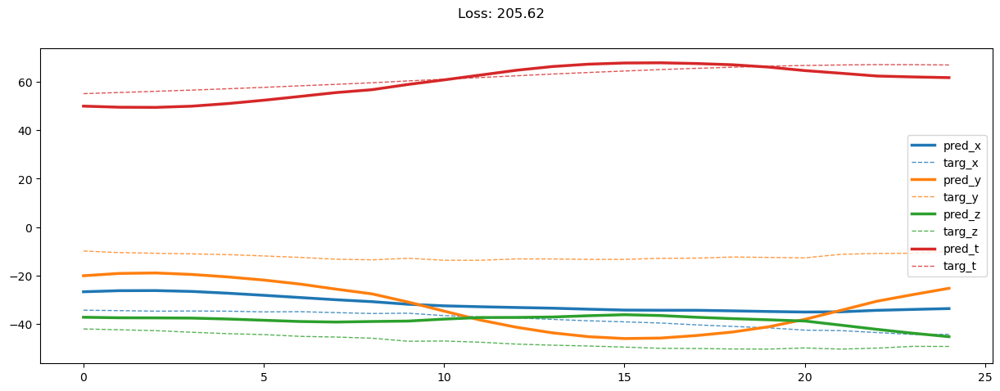

04400: train loss:  71.323, imu loss:  0.124, mag loss:  22.736, div loss:  45.247, slim:  3.916, tlim:  2.983
       valid loss:  202.849, imu loss:  0.091, mag loss:  89.138, div loss:  108.943, slim:  4.307, tlim:  4.802
04420: train loss:  71.061, imu loss:  0.124, mag loss:  22.604, div loss:  45.112, slim:  3.921, tlim:  2.987
       valid loss:  203.267, imu loss:  0.091, mag loss:  88.320, div loss:  110.133, slim:  4.350, tlim:  4.846
04440: train loss:  71.076, imu loss:  0.123, mag loss:  22.546, div loss:  45.207, slim:  3.896, tlim:  2.968
       valid loss:  204.136, imu loss:  0.091, mag loss:  89.713, div loss:  109.627, slim:  4.340, tlim:  4.826
04460: train loss:  71.077, imu loss:  0.124, mag loss:  22.622, div loss:  45.096, slim:  3.921, tlim:  3.006
       valid loss:  201.027, imu loss:  0.091, mag loss:  87.245, div loss:  108.986, slim:  4.354, tlim:  4.821
04480: train loss:  70.148, imu loss:  0.124, mag loss:  22.383, div loss:  44.436, slim:  3.912, tlim: 

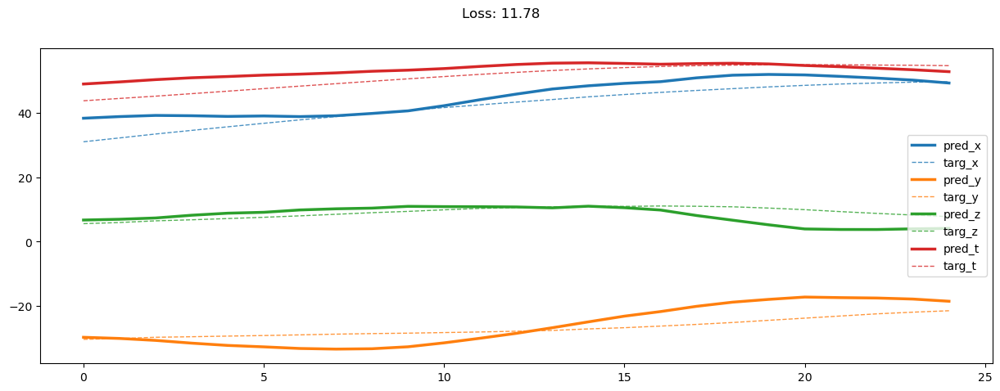

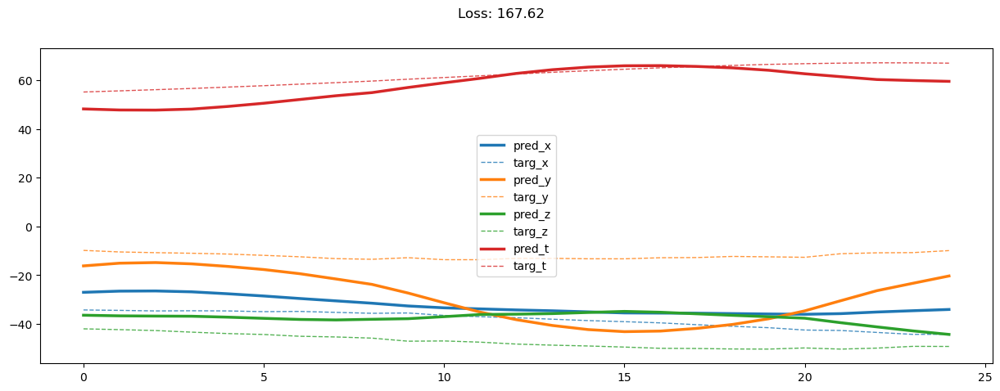

04600: train loss:  69.904, imu loss:  0.124, mag loss:  22.196, div loss:  44.385, slim:  3.954, tlim:  2.947
       valid loss:  204.048, imu loss:  0.091, mag loss:  89.573, div loss:  109.612, slim:  4.411, tlim:  4.892
04620: train loss:  70.224, imu loss:  0.123, mag loss:  22.331, div loss:  44.545, slim:  3.976, tlim:  2.973
       valid loss:  205.065, imu loss:  0.091, mag loss:  89.682, div loss:  110.573, slim:  4.383, tlim:  4.831
04640: train loss:  70.279, imu loss:  0.124, mag loss:  22.348, div loss:  44.591, slim:  3.963, tlim:  2.966
       valid loss:  202.247, imu loss:  0.091, mag loss:  87.858, div loss:  109.559, slim:  4.419, tlim:  4.846
04660: train loss:  69.804, imu loss:  0.123, mag loss:  22.163, div loss:  44.314, slim:  3.944, tlim:  2.957
       valid loss:  203.310, imu loss:  0.091, mag loss:  88.052, div loss:  110.376, slim:  4.429, tlim:  4.912
04680: train loss:  69.342, imu loss:  0.123, mag loss:  21.992, div loss:  44.022, slim:  3.964, tlim: 

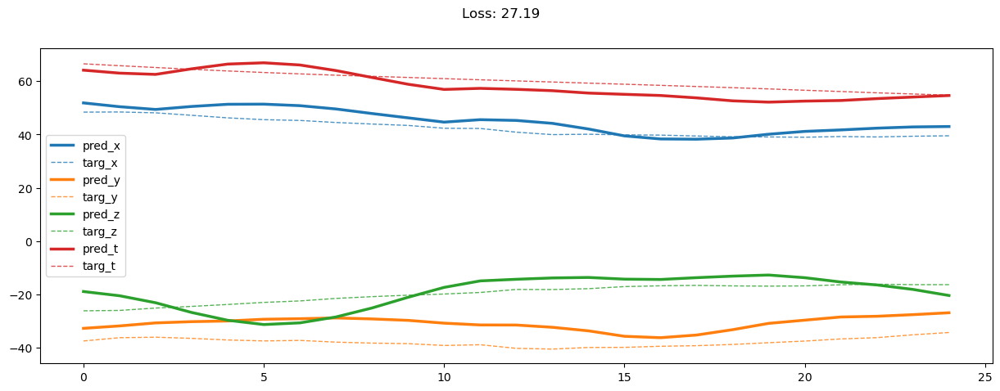

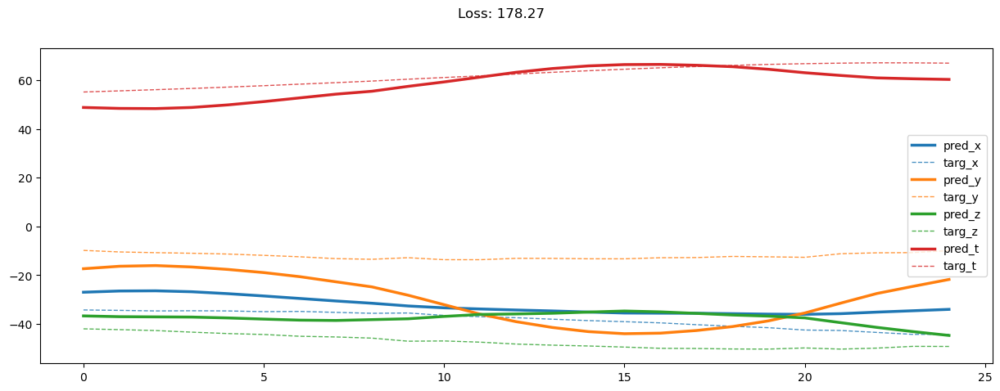

04800: train loss:  69.513, imu loss:  0.123, mag loss:  21.937, div loss:  44.258, slim:  3.947, tlim:  2.944
       valid loss:  205.268, imu loss:  0.091, mag loss:  89.469, div loss:  110.946, slim:  4.463, tlim:  4.862
04820: train loss:  69.025, imu loss:  0.124, mag loss:  21.819, div loss:  43.900, slim:  3.947, tlim:  2.928
       valid loss:  203.827, imu loss:  0.091, mag loss:  88.250, div loss:  110.726, slim:  4.471, tlim:  4.856
04840: train loss:  68.521, imu loss:  0.124, mag loss:  21.889, div loss:  43.339, slim:  3.948, tlim:  2.910
       valid loss:  205.654, imu loss:  0.091, mag loss:  89.715, div loss:  111.113, slim:  4.390, tlim:  4.850
04860: train loss:  68.912, imu loss:  0.123, mag loss:  21.927, div loss:  43.657, slim:  3.986, tlim:  2.943
       valid loss:  205.815, imu loss:  0.091, mag loss:  89.914, div loss:  111.056, slim:  4.431, tlim:  4.862
04880: train loss:  68.998, imu loss:  0.123, mag loss:  21.957, div loss:  43.730, slim:  3.935, tlim: 

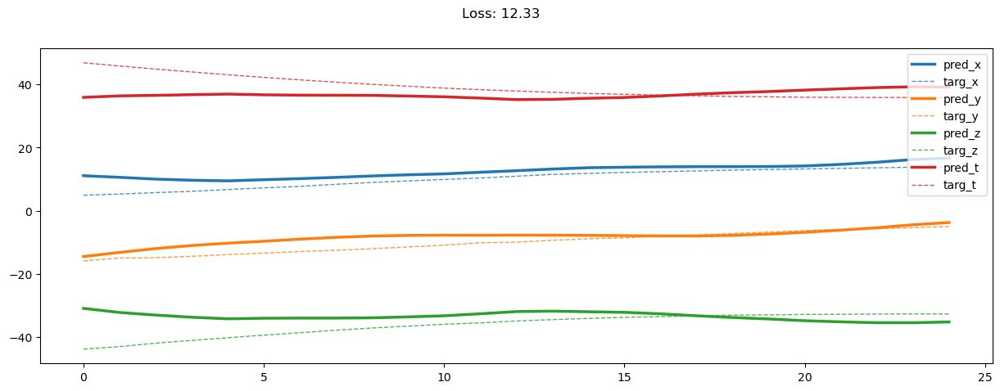

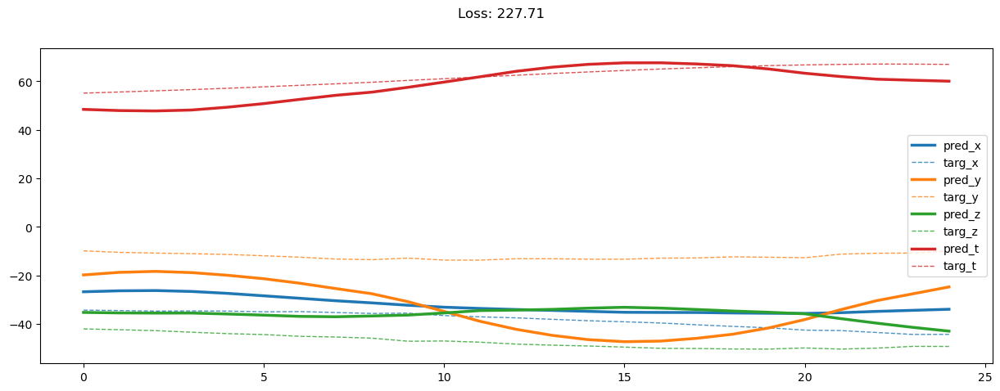

05000: train loss:  68.575, imu loss:  0.123, mag loss:  21.750, div loss:  43.510, slim:  3.969, tlim:  2.934
       valid loss:  205.645, imu loss:  0.091, mag loss:  90.241, div loss:  110.564, slim:  4.429, tlim:  4.855
05020: train loss:  68.423, imu loss:  0.124, mag loss:  21.616, div loss:  43.486, slim:  3.982, tlim:  2.936
       valid loss:  206.811, imu loss:  0.091, mag loss:  89.949, div loss:  111.958, slim:  4.511, tlim:  4.915
05040: train loss:  68.231, imu loss:  0.124, mag loss:  21.679, div loss:  43.247, slim:  3.964, tlim:  2.921
       valid loss:  205.743, imu loss:  0.091, mag loss:  89.540, div loss:  111.318, slim:  4.488, tlim:  4.896
05060: train loss:  67.501, imu loss:  0.123, mag loss:  21.534, div loss:  42.653, slim:  3.998, tlim:  2.923
       valid loss:  205.750, imu loss:  0.091, mag loss:  90.074, div loss:  110.823, slim:  4.464, tlim:  4.860
05080: train loss:  67.493, imu loss:  0.123, mag loss:  21.417, div loss:  42.767, slim:  3.966, tlim: 

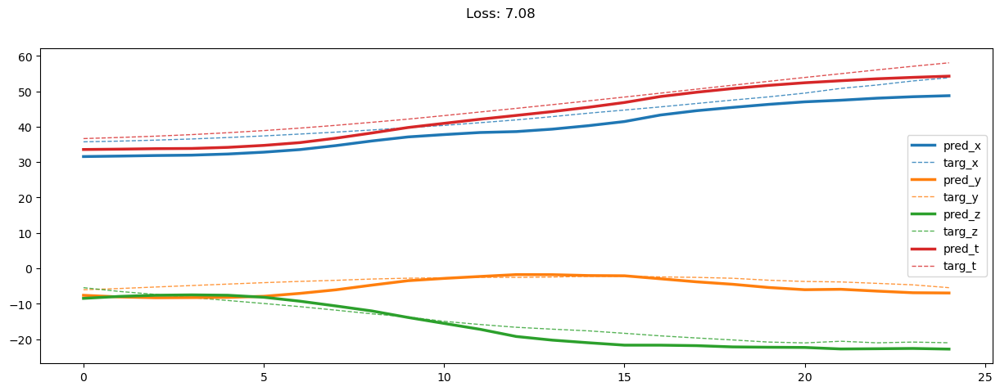

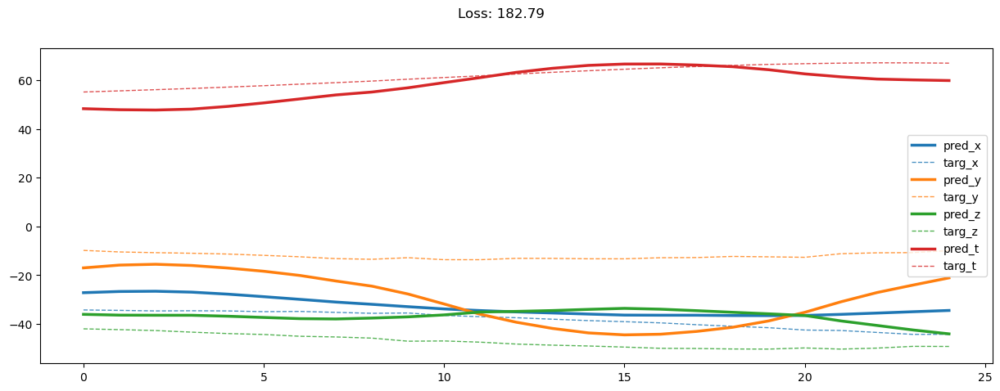

05200: train loss:  66.763, imu loss:  0.123, mag loss:  21.212, div loss:  42.261, slim:  3.969, tlim:  2.901
       valid loss:  206.023, imu loss:  0.091, mag loss:  90.345, div loss:  110.801, slim:  4.464, tlim:  4.893
05220: train loss:  67.262, imu loss:  0.124, mag loss:  21.349, div loss:  42.607, slim:  3.962, tlim:  2.924
       valid loss:  208.540, imu loss:  0.091, mag loss:  91.120, div loss:  112.489, slim:  4.562, tlim:  4.934
05240: train loss:  67.208, imu loss:  0.124, mag loss:  21.356, div loss:  42.535, slim:  3.986, tlim:  2.928
       valid loss:  207.874, imu loss:  0.091, mag loss:  91.331, div loss:  111.704, slim:  4.407, tlim:  4.863
05260: train loss:  67.383, imu loss:  0.123, mag loss:  21.338, div loss:  42.733, slim:  4.004, tlim:  2.917
       valid loss:  207.816, imu loss:  0.091, mag loss:  90.990, div loss:  111.898, slim:  4.515, tlim:  4.943
05280: train loss:  66.897, imu loss:  0.123, mag loss:  21.258, div loss:  42.352, slim:  3.975, tlim: 

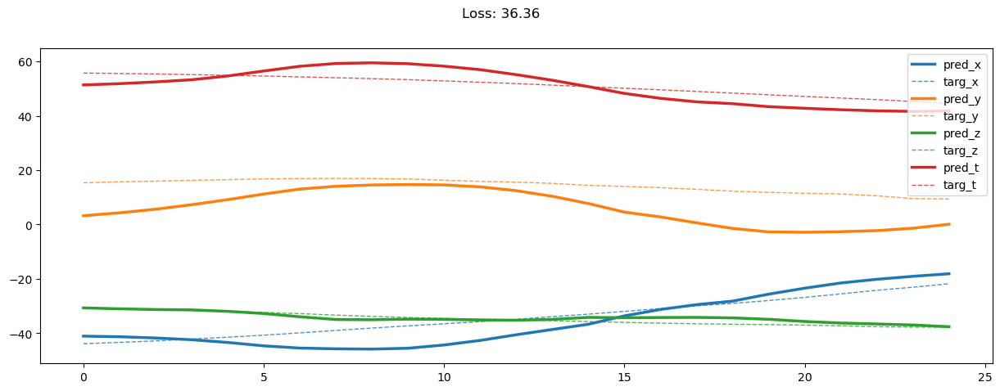

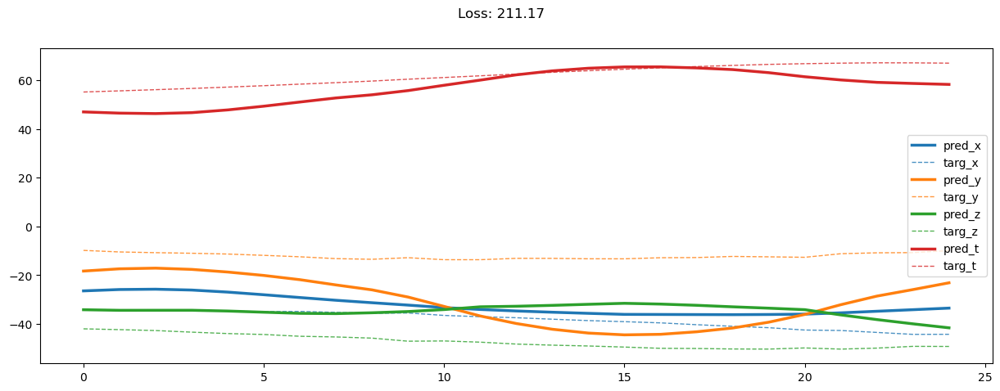

05400: train loss:  66.059, imu loss:  0.124, mag loss:  21.029, div loss:  41.747, slim:  3.965, tlim:  2.891
       valid loss:  208.461, imu loss:  0.091, mag loss:  91.137, div loss:  112.389, slim:  4.498, tlim:  4.958
05420: train loss:  65.821, imu loss:  0.123, mag loss:  20.873, div loss:  41.655, slim:  3.995, tlim:  2.896
       valid loss:  206.845, imu loss:  0.091, mag loss:  89.687, div loss:  112.267, slim:  4.467, tlim:  4.911
05440: train loss:  66.453, imu loss:  0.123, mag loss:  21.031, div loss:  42.135, slim:  3.981, tlim:  2.892
       valid loss:  207.647, imu loss:  0.091, mag loss:  90.788, div loss:  111.978, slim:  4.488, tlim:  4.891
05460: train loss:  66.450, imu loss:  0.123, mag loss:  21.009, div loss:  42.168, slim:  3.940, tlim:  2.887
       valid loss:  207.594, imu loss:  0.091, mag loss:  90.640, div loss:  112.093, slim:  4.485, tlim:  4.865
05480: train loss:  65.769, imu loss:  0.122, mag loss:  20.859, div loss:  41.640, slim:  3.985, tlim: 

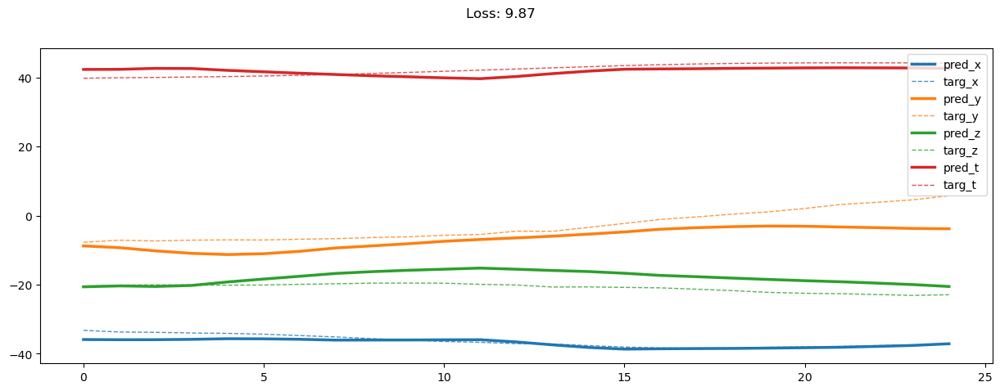

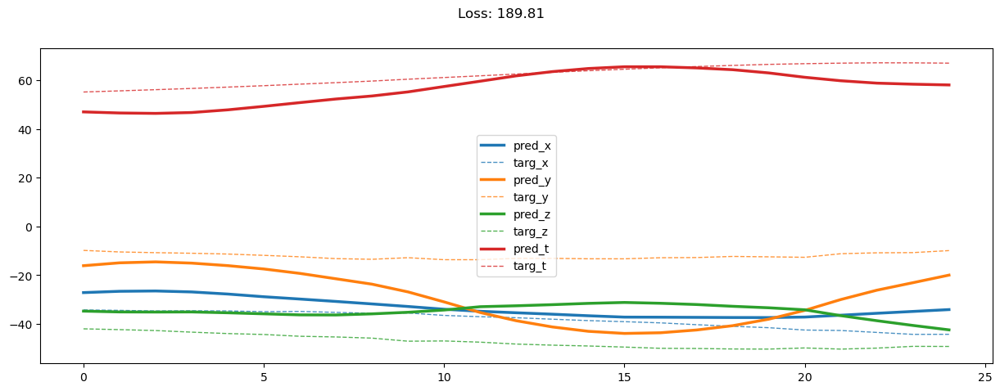

05600: train loss:  65.037, imu loss:  0.124, mag loss:  20.620, div loss:  41.159, slim:  3.989, tlim:  2.850
       valid loss:  207.719, imu loss:  0.091, mag loss:  91.156, div loss:  111.682, slim:  4.526, tlim:  4.879
05620: train loss:  65.403, imu loss:  0.123, mag loss:  20.670, div loss:  41.465, slim:  3.994, tlim:  2.862
       valid loss:  207.827, imu loss:  0.091, mag loss:  91.158, div loss:  111.767, slim:  4.496, tlim:  4.917
05640: train loss:  65.237, imu loss:  0.123, mag loss:  20.674, div loss:  41.281, slim:  3.986, tlim:  2.884
       valid loss:  208.862, imu loss:  0.091, mag loss:  91.897, div loss:  112.070, slim:  4.449, tlim:  4.921
05660: train loss:  65.559, imu loss:  0.123, mag loss:  20.755, div loss:  41.534, slim:  3.993, tlim:  2.865
       valid loss:  210.519, imu loss:  0.091, mag loss:  92.958, div loss:  112.621, slim:  4.571, tlim:  4.941
05680: train loss:  64.928, imu loss:  0.122, mag loss:  20.543, div loss:  41.123, slim:  3.999, tlim: 

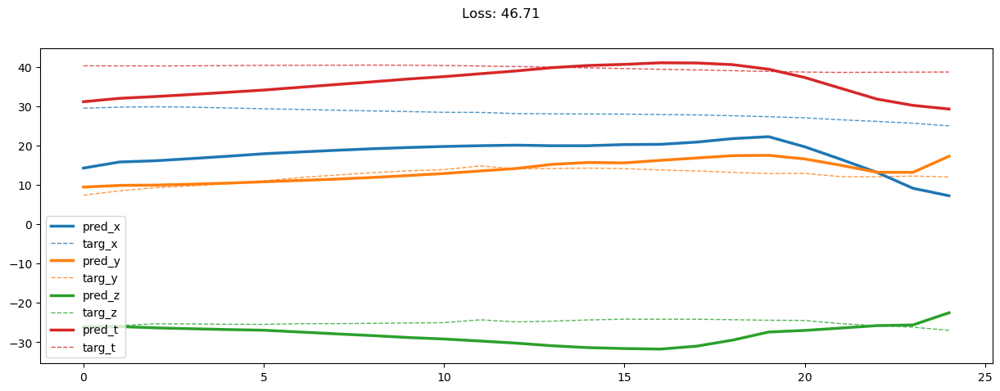

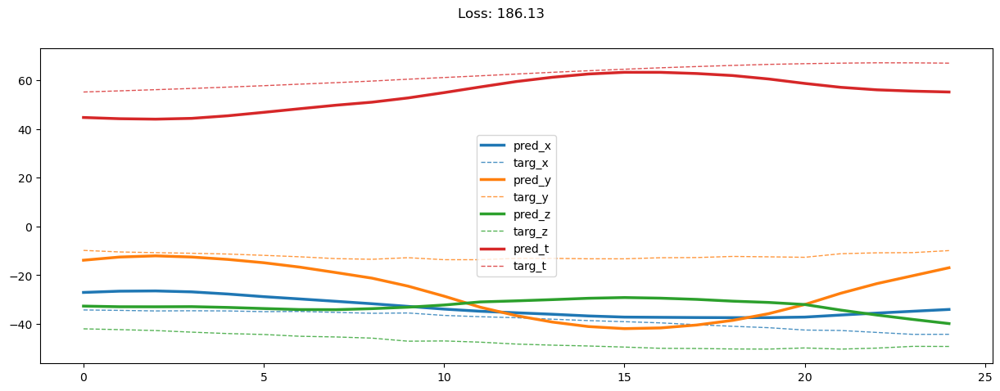

05800: train loss:  64.603, imu loss:  0.124, mag loss:  20.431, div loss:  40.906, slim:  3.998, tlim:  2.857
       valid loss:  207.706, imu loss:  0.091, mag loss:  90.057, div loss:  112.753, slim:  4.490, tlim:  4.911
05820: train loss:  64.250, imu loss:  0.123, mag loss:  20.388, div loss:  40.590, slim:  4.013, tlim:  2.861
       valid loss:  209.784, imu loss:  0.091, mag loss:  92.303, div loss:  112.597, slim:  4.470, tlim:  4.901
05840: train loss:  64.663, imu loss:  0.123, mag loss:  20.367, div loss:  41.022, slim:  4.010, tlim:  2.865
       valid loss:  208.943, imu loss:  0.091, mag loss:  91.588, div loss:  112.429, slim:  4.486, tlim:  4.952
05860: train loss:  63.850, imu loss:  0.123, mag loss:  20.239, div loss:  40.364, slim:  3.990, tlim:  2.835
       valid loss:  209.565, imu loss:  0.091, mag loss:  91.388, div loss:  113.243, slim:  4.481, tlim:  4.963
05880: train loss:  63.776, imu loss:  0.123, mag loss:  20.195, div loss:  40.315, slim:  4.010, tlim: 

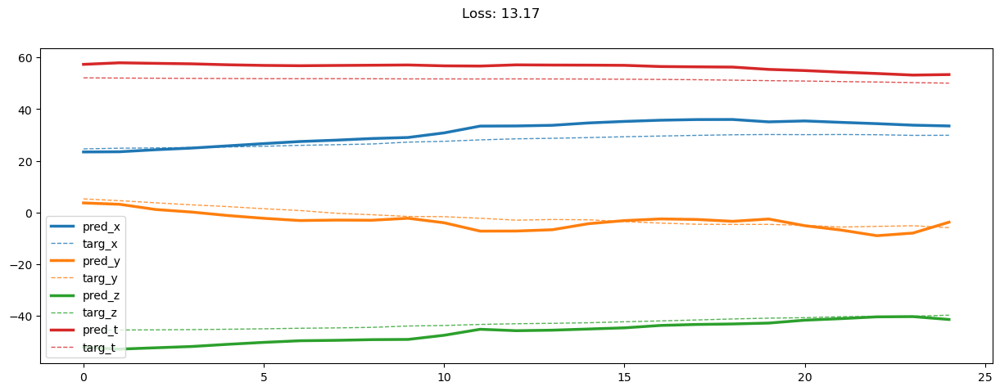

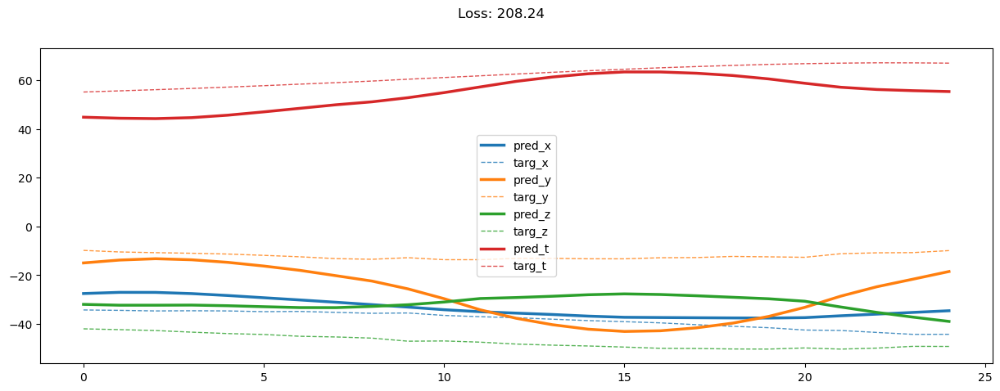

06000: train loss:  63.129, imu loss:  0.123, mag loss:  20.013, div loss:  39.868, slim:  4.023, tlim:  2.827
       valid loss:  210.497, imu loss:  0.091, mag loss:  92.413, div loss:  113.106, slim:  4.587, tlim:  4.987


In [55]:
draw = True

for epoch in range(6000):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 200 == 0:
        draw = True
    
    train_loss, train_imu_loss, train_mag_loss, t_d1_loss, tlim_loss = train(train_loader, draw)
    valid_loss, valid_imu_loss, valid_mag_loss, v_d1_loss, vlim_loss = evalute(valid_loader, draw)
    
    draw = False
    
    if (epoch + 1) % 20 == 0:
        ep = str(epoch + 1).zfill(5)
        print(f'{ep:>5}: train loss: {train_loss: 2.3f}, imu loss: {train_imu_loss: 2.3f}, mag loss: {train_mag_loss: 2.3f}, div loss: {t_d1_loss: 2.3f}, slim: {tlim_loss[0]: 2.3f}, tlim: {tlim_loss[1]: 2.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss: 2.3f}, imu loss: {valid_imu_loss: 2.3f}, mag loss: {valid_mag_loss: 2.3f}, div loss: {v_d1_loss: 2.3f}, slim: {vlim_loss[0]: 2.3f}, tlim: {vlim_loss[1]: 2.3f}')

In [44]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    class_results = []
    class_labels = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 7:10]
            source_total_mag = source_data[:, :, 10]
            source_angle = source_data[:, :, 6]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 7:10]
            target_total_mag = target_data[:, :, 10]
            target_angle = source_data[:, :, 6]
            
            st_angle = torch.concat((source_angle[:, :, None], target_angle[:, :, None]), dim=-1)

            # generate mag
            source_pred_class, source_pred_one_hot = classifier.predict_label(source_imu)
            z_imu, predict_mag = model(source_imu, source_mag, source_pred_one_hot, st_angle)


            # generator loss
#             gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)

            # record loss
            predict_mag = predict_mag.detach().cpu().numpy()
            target_mag = target_mag.cpu().numpy()
            source_label = source_label.detach().cpu().numpy()
            
            results.extend(zip(predict_mag, target_mag, source_label))
            
            diff = np.power(predict_mag.reshape(len(predict_mag), -1, 3) - target_mag.reshape(len(target_mag), -1, 3), 2).mean(axis=1)
            class_results.extend(diff)
            class_labels.extend(source_label)
    
    return np.array(results, dtype=object), np.array(class_results), np.array(class_labels)

In [56]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    source_label = result[2]
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{classes[source_label]}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

(8973, 3) (8973,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    21.58    17.36    11.90    16.95
         pocket loss:    23.47    23.94    21.39    22.93
          swing loss:    22.65    30.20    25.46    26.10
        average loss:    22.55    23.71    19.46    21.91


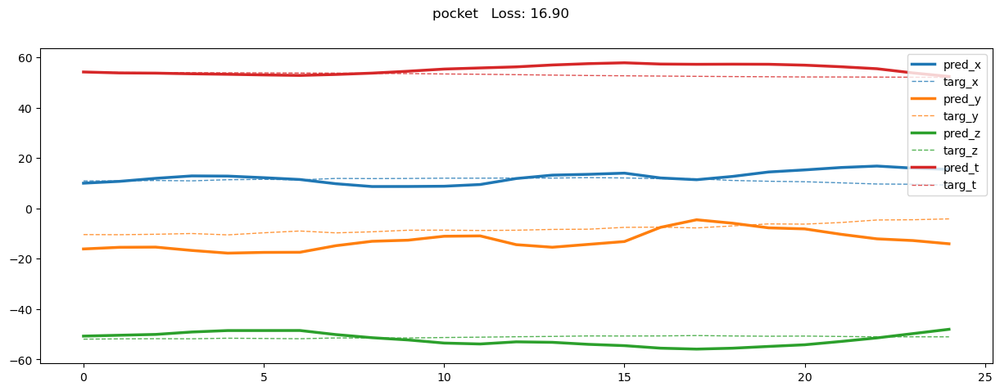

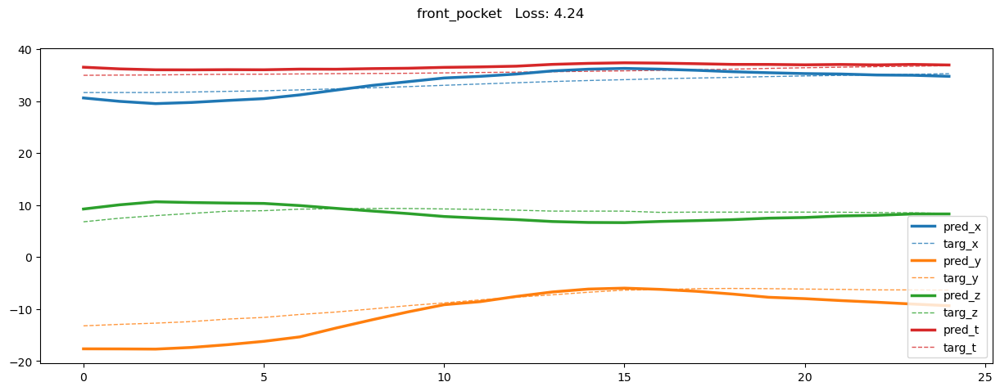

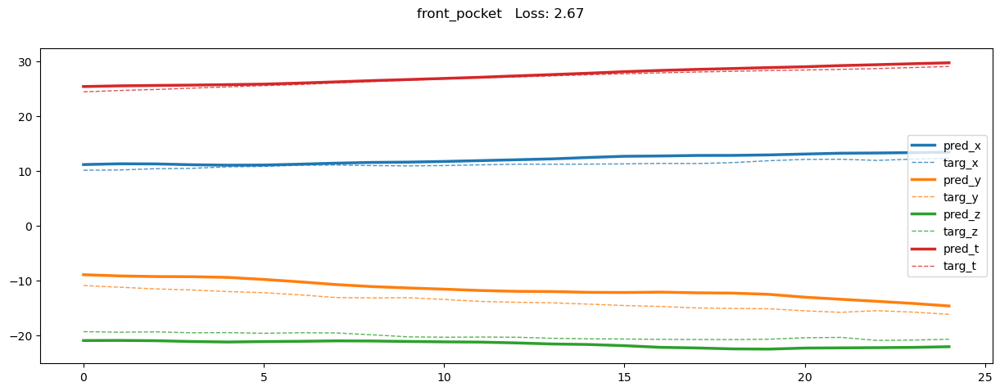

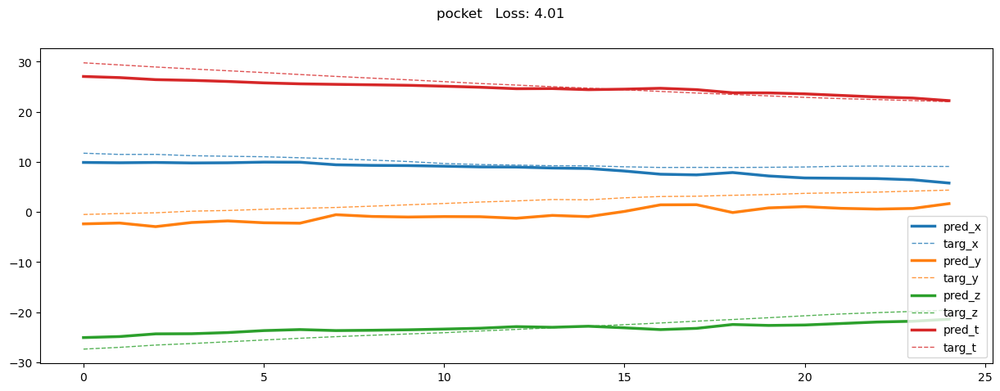

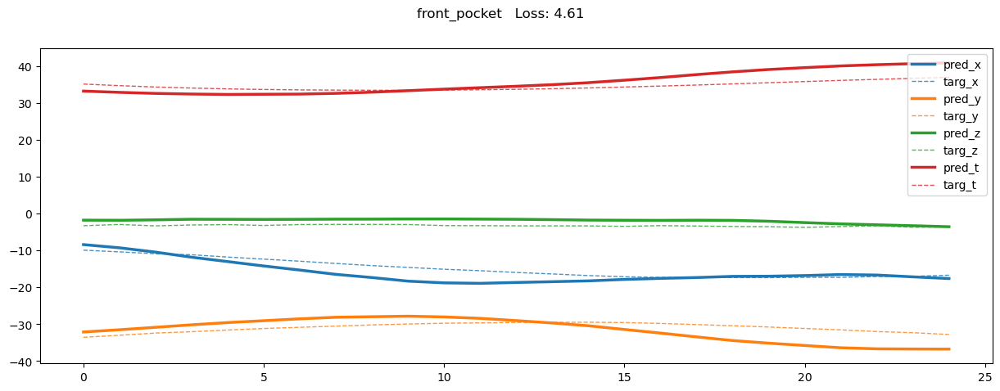

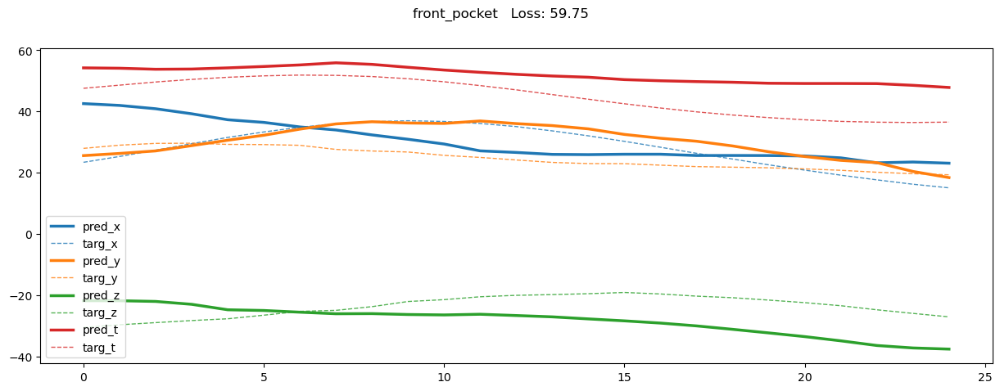

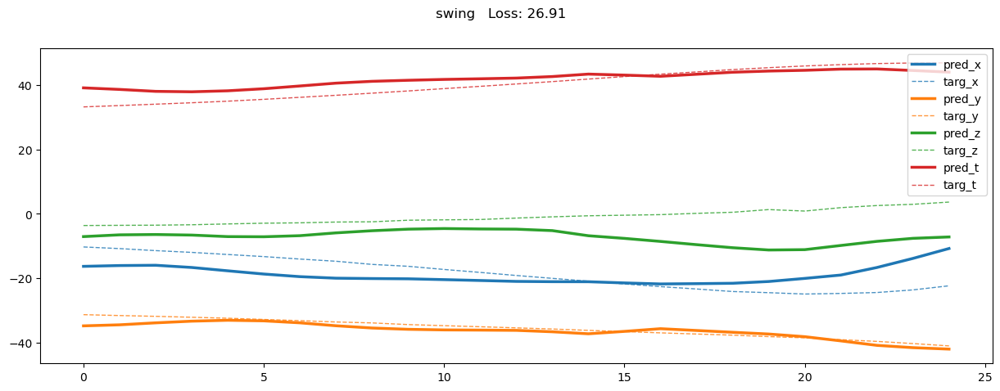

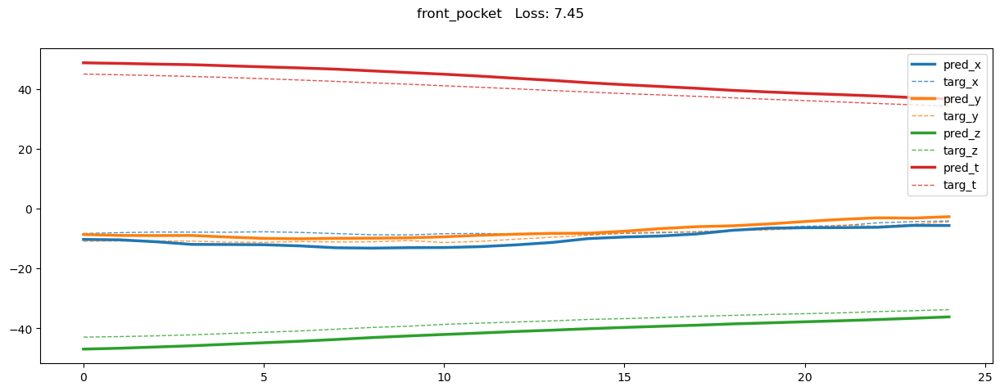

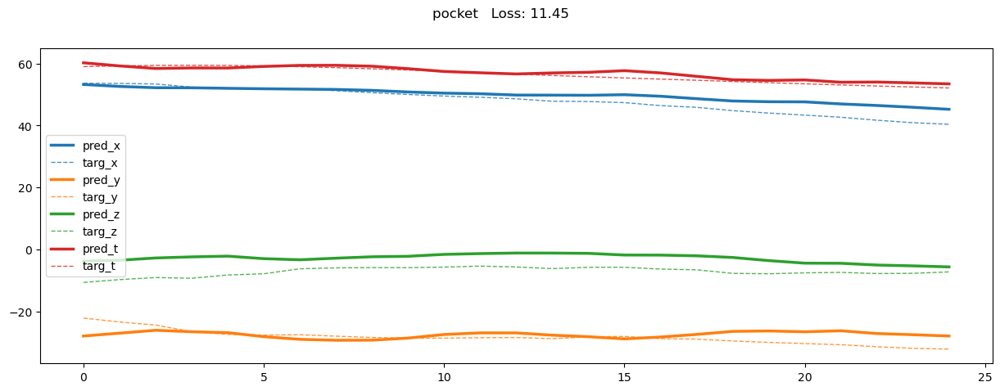

In [57]:
results, cres, clabel = output_eval(model, train_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::1000]:
    plot_result(rs)

(1273, 3) (1273,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    41.87    33.50    23.51    32.96
         pocket loss:    93.01    85.29    75.70    84.67
          swing loss:   119.68   167.70   142.71   143.36
        average loss:    83.16    93.43    78.66    85.08


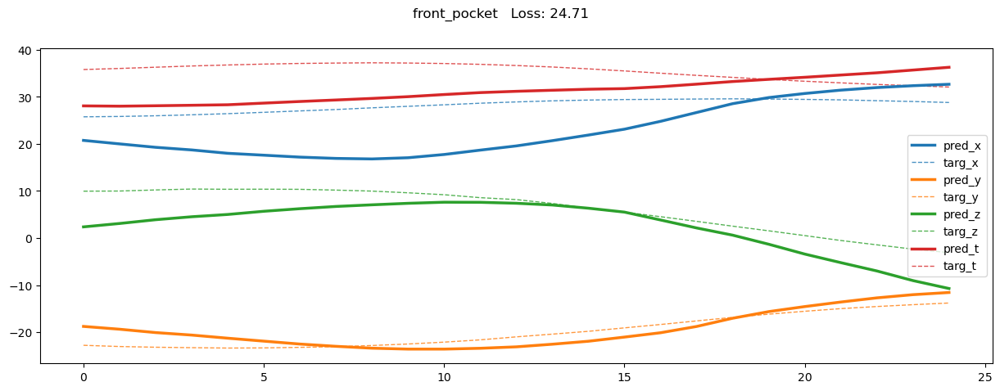

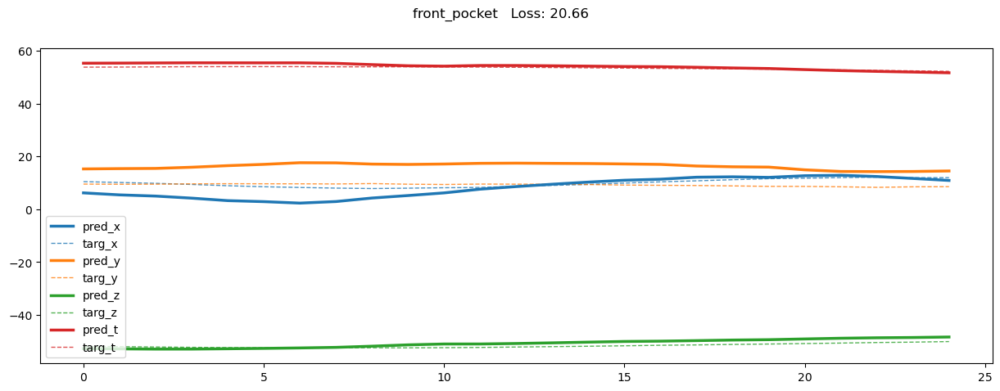

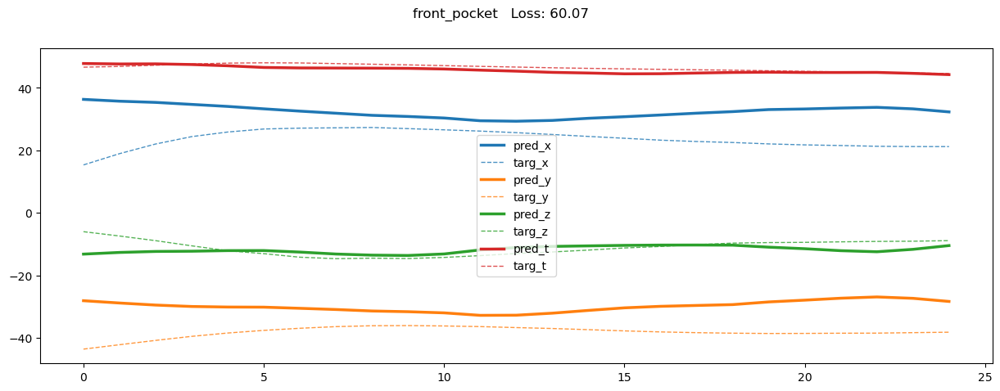

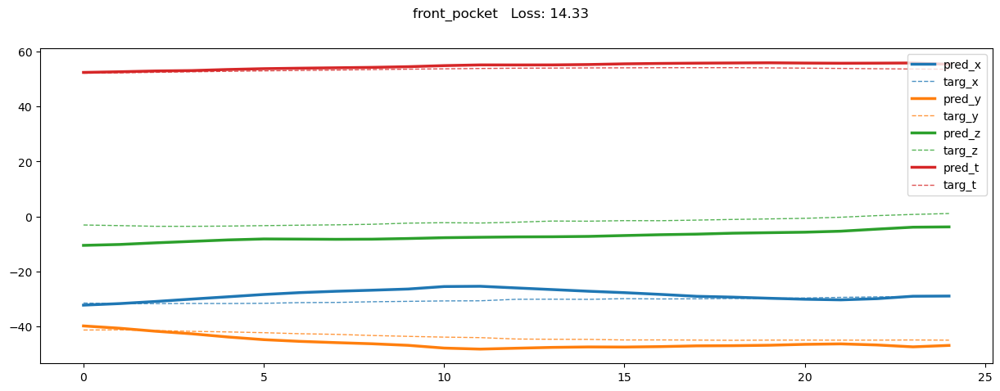

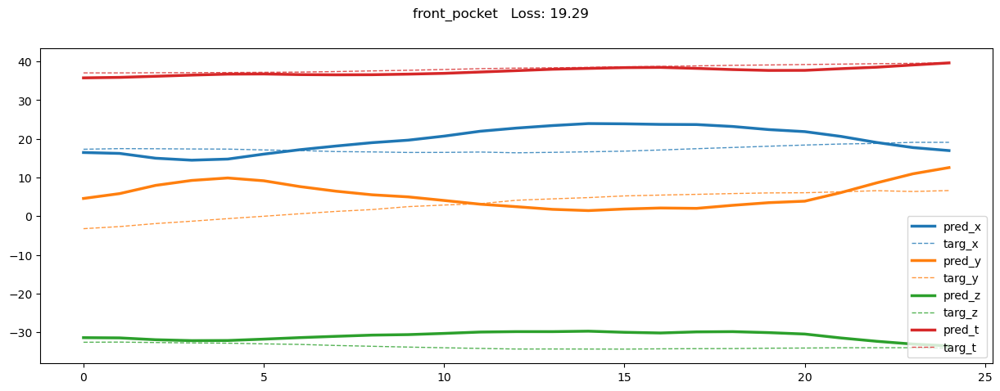

...

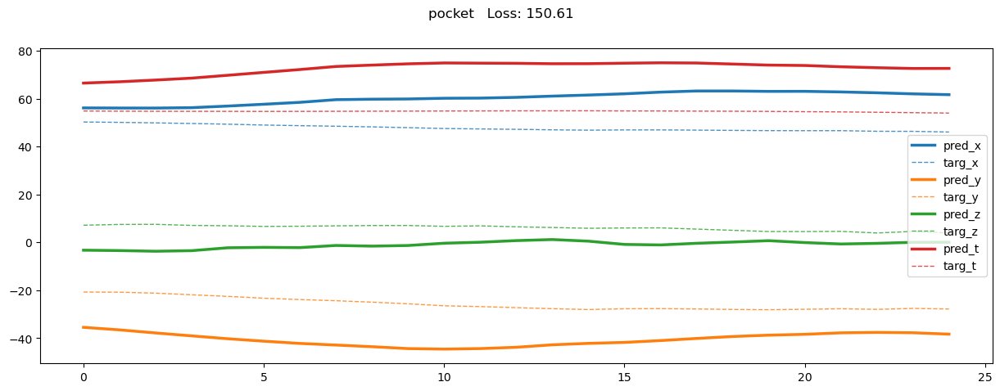

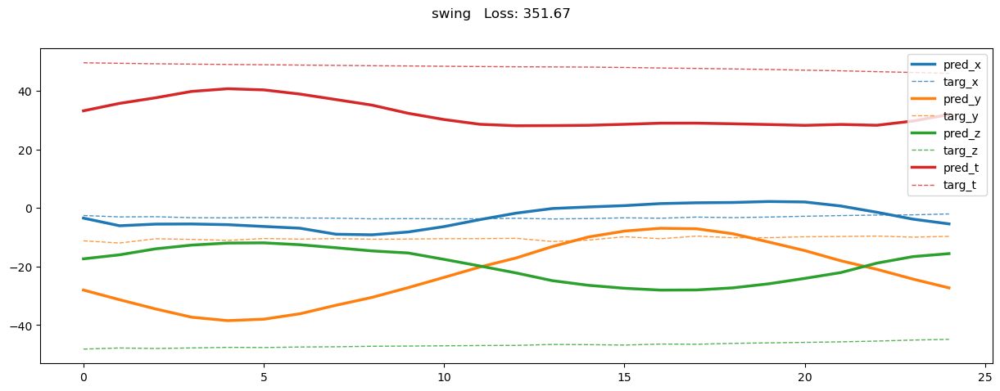

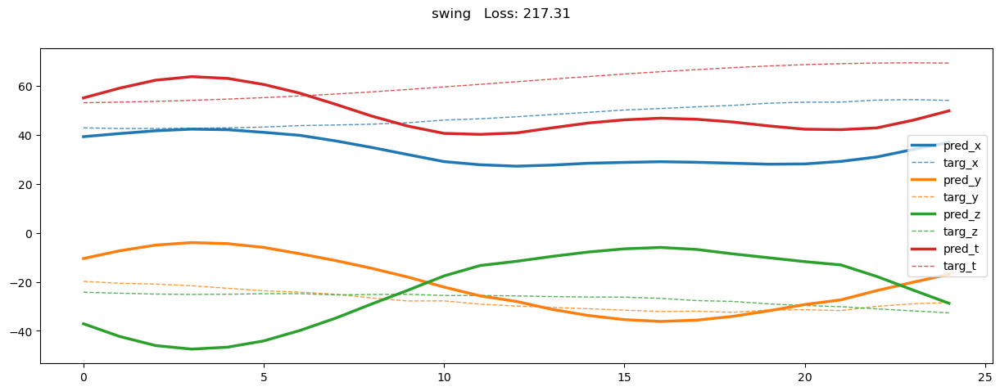

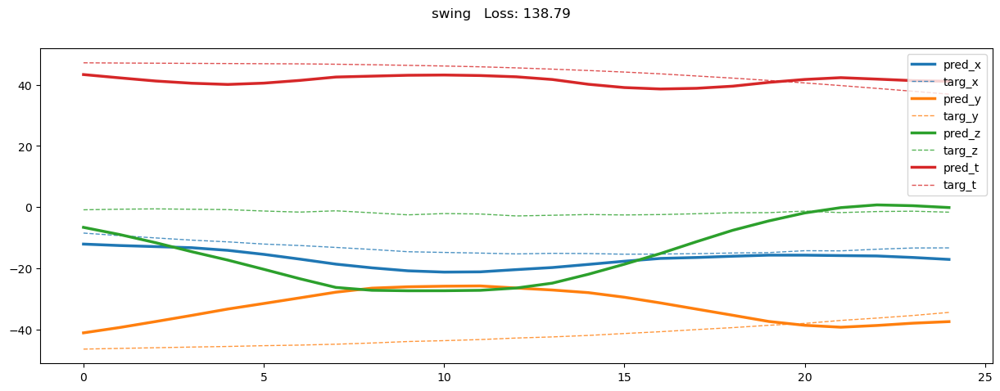

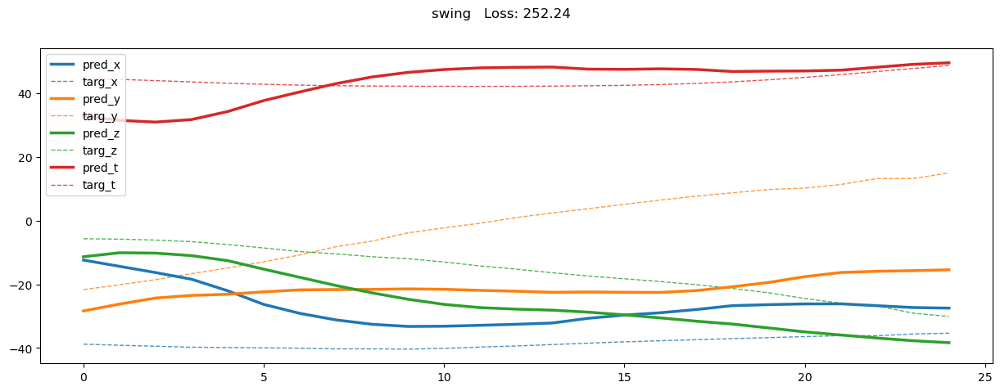

In [58]:
results, cres, clabel = output_eval(model, valid_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::100]:
    plot_result(rs)

In [50]:
def plot_eval_result(result, path):
    pred_mag = np.stack(results[:, 0], axis=0)[:, 0].reshape(-1, 3)
    targ_mag = np.stack(results[:, 1], axis=0)[:, 0].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(25, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{path}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [59]:
def load_data(folder_path):
    source_path = os.path.join(folder_path, 'source')
    target_path = os.path.join(folder_path, 'target')

    #########################
    ##### check devices #####
    #########################
    source_path, target_path = check_data_device(source_path, target_path)

    ####################################
    ##### load and preprocess data #####
    ####################################
    source_df = load_original_data(source_path, rotate=False)
    target_df = load_original_data(target_path, rotate=True)

    source_df, target_df = bound_range(source_df), bound_range(target_df)
    source_df, target_df = align_data(source_df, target_df)
    
    return select_data(source_df), select_data(target_df)

def split_data(df):
    ncols = seq_len
    nrows = len(df) - seq_len + 1
    
    index = np.zeros((nrows, ncols), dtype=int)
    index += np.arange(ncols)
    index += np.arange(nrows).T[:, None]
    
    return df.to_numpy()[index]    

def combine_to_dataloader(source, target):
    dataset = PairDataset(
                        source_data = torch.tensor(source, dtype=torch.float),
                        source_label = np.zeros(len(source)),
                        target_data = torch.tensor(target, dtype=torch.float),
                        target_label = np.zeros(len(target)),
                    )
    dataloader = DataLoader(dataset, batch_size=512, shuffle=False)
    
    return dataloader

def generate_dataloader(folder_path):
    source_df, target_df = load_data(folder_path)
    source_segs, target_segs = split_data(source_df), split_data(target_df)

    return combine_to_dataloader(source_segs, target_segs)

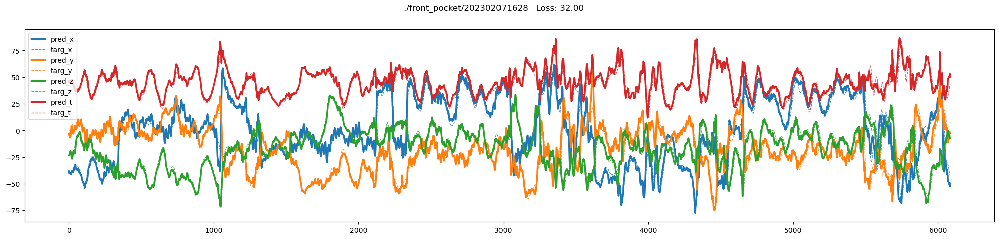

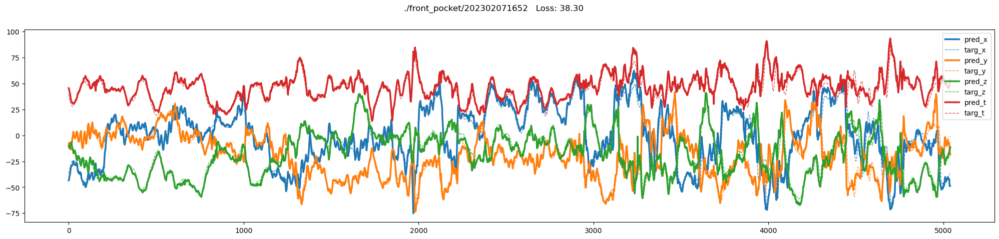

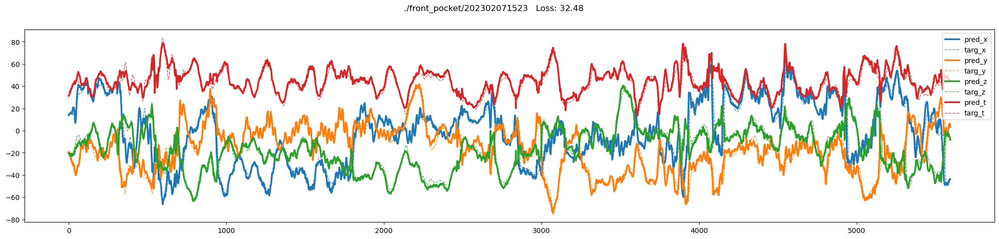

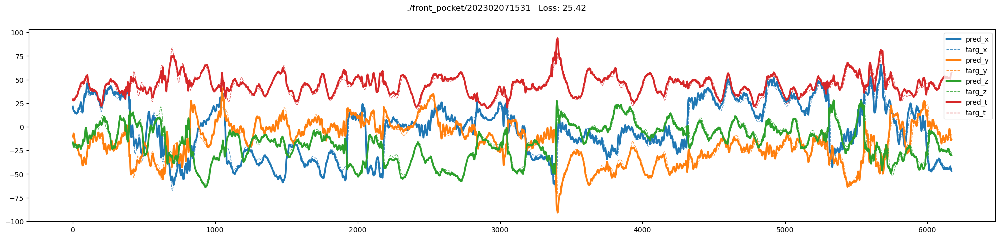

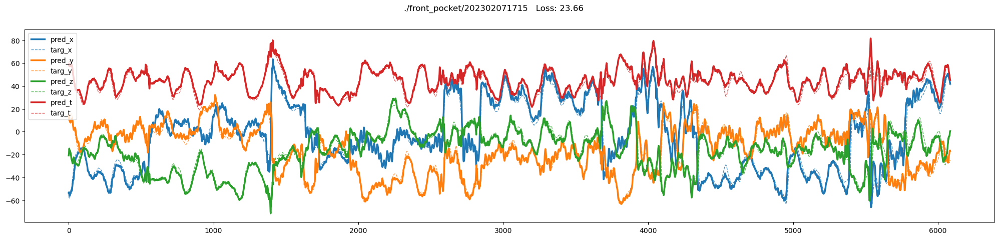

...

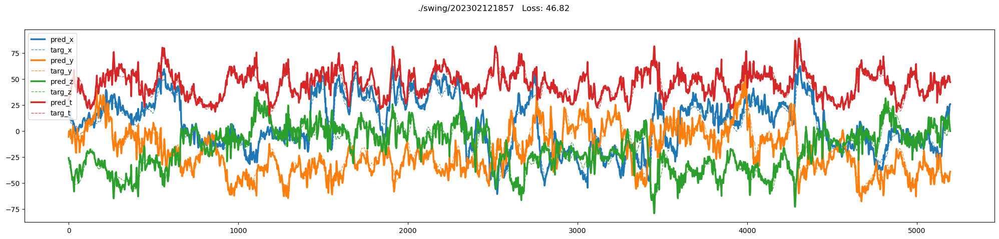

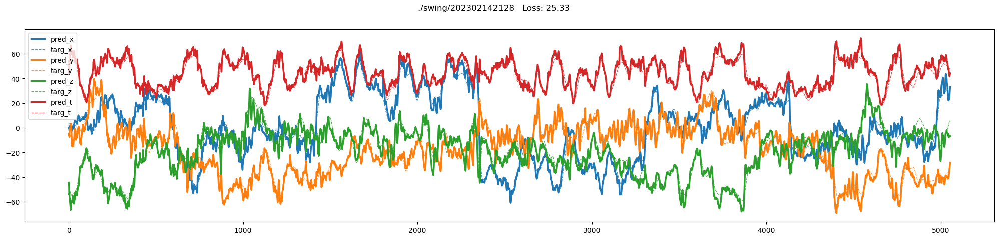

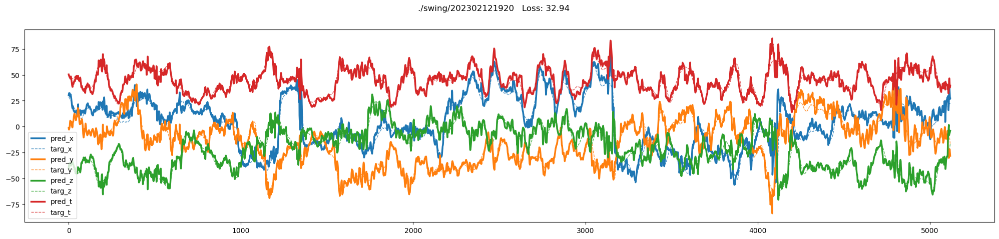

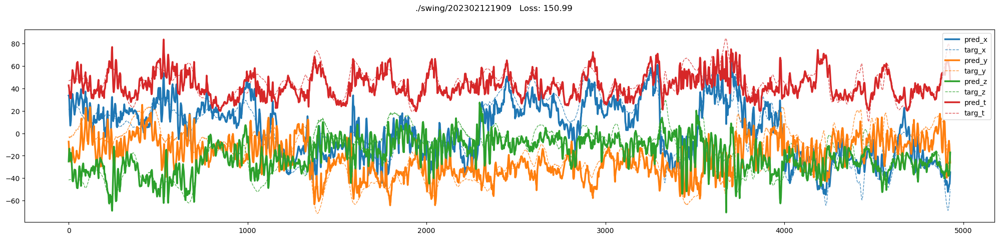

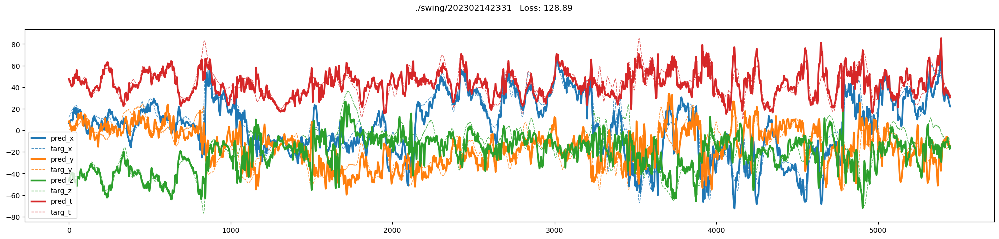

In [60]:
for folder in ['./front_pocket/*', './pocket/*', './swing/*']:
    for path in glob.glob(folder):
        eval_loader = generate_dataloader(path)
        results, _, _ = output_eval(model, eval_loader)
        plot_eval_result(results, path)